<a href="https://colab.research.google.com/github/lawrenceN/d3/blob/master/Discovering_Outbreaks_from_News_headlines.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Extracting City and Country Information from News

Parse the News headlines. Specifically we want to find any city and/or country names mentioned in each of the news headlines. We then will use the names to find geographical locations of the headlines. 




1.   Load the data
2.   Use regular expressions and the cities and coutries using geonamescache library ( match any cities/countries with a news item.
3. The extracted data will be put in Pandas DataFrame with the columns: healine, city, country 
4. Check that no issues exist on the data (by sampling)
5. Save the data that will have no issues 



## Read the Data

In [ ]:
with open('/content/headlines')as file:
  myData=[headlines.strip() for headlines in file]

In [ ]:
type(myData)

list

In [ ]:
myData[1:4]

['Could Zika Reach New York City?',
 'First Case of Zika in Miami Beach',
 'Mystery Virus Spreads in Recife, Brazil']

## Cities and Countries using Geonamescache library 

In [ ]:
!pip install geonamescache
import geonamescache 

     |████████████████████████████████| 839kB 2.7MB/s 


In [ ]:
gc=geonamescache.GeonamesCache()
countries=[country['name'] for country in gc.get_countries().values()]

In [ ]:
countries[6:609]

['Armenia',
 'Angola',
 'Antarctica',
 'Argentina',
 'American Samoa',
 'Austria',
 'Australia',
 'Aruba',
 'Aland Islands',
 'Azerbaijan',
 'Bosnia and Herzegovina',
 'Barbados',
 'Bangladesh',
 'Belgium',
 'Burkina Faso',
 'Bulgaria',
 'Bahrain',
 'Burundi',
 'Benin',
 'Saint Barthelemy',
 'Bermuda',
 'Brunei',
 'Bolivia',
 'Bonaire, Saint Eustatius and Saba ',
 'Brazil',
 'Bahamas',
 'Bhutan',
 'Bouvet Island',
 'Botswana',
 'Belarus',
 'Belize',
 'Canada',
 'Cocos Islands',
 'Democratic Republic of the Congo',
 'Central African Republic',
 'Republic of the Congo',
 'Switzerland',
 'Ivory Coast',
 'Cook Islands',
 'Chile',
 'Cameroon',
 'China',
 'Colombia',
 'Costa Rica',
 'Cuba',
 'Cabo Verde',
 'Curacao',
 'Christmas Island',
 'Cyprus',
 'Czechia',
 'Germany',
 'Djibouti',
 'Denmark',
 'Dominica',
 'Dominican Republic',
 'Algeria',
 'Ecuador',
 'Estonia',
 'Egypt',
 'Western Sahara',
 'Eritrea',
 'Spain',
 'Ethiopia',
 'Finland',
 'Fiji',
 'Falkland Islands',
 'Micronesia',
 'Far

In [ ]:
cities=[city['name'] for city in gc.get_cities().values()]

In [ ]:
cities[:7]

['Andorra la Vella',
 'Umm Al Quwain City',
 'Ras Al Khaimah City',
 'Zayed City',
 'Khawr Fakkān',
 'Dubai',
 'Dibba Al-Fujairah']

## Duplicate Cities 

In [ ]:
from collections import Counter

In [ ]:
city_counts=Counter(cities)


In [ ]:
city_counts.most_common(20)

[('Springfield', 8),
 ('San Pedro', 7),
 ('Richmond', 7),
 ('San Fernando', 7),
 ('Mercedes', 6),
 ('La Paz', 6),
 ('Victoria', 6),
 ('San Francisco', 6),
 ('Auburn', 6),
 ('Santa Cruz', 6),
 ('Burlington', 6),
 ('San Carlos', 6),
 ('La Unión', 6),
 ('San Marcos', 6),
 ('San Vicente', 5),
 ('San Lorenzo', 5),
 ('San Isidro', 5),
 ('Santa Rosa', 5),
 ('San Juan', 5),
 ('Lincoln', 5)]

## Removing Accent Marks

In this section we remove the accent marks. We use the unidecode libray method. For the cities and countries from geonamescache, we map the unaccented  name to the accented name

In [ ]:
!pip install unidecode
import unidecode

     |████████████████████████████████| 245kB 2.6MB/s 


In [ ]:
country_accent_mapping={unidecode.unidecode(country): country for country in countries}

In [ ]:
type(country_accent_mapping)

dict

In [ ]:
city_accent_mapping={unidecode.unidecode(city):city for city in cities}

In [ ]:
city_accent_mapping['Nairobi']

'Nairobi'

In [ ]:
country_accent_mapping['Kenya']

'Kenya'

We remove the accent marks from the headlines so that we can match on the unaccented version (*Keys mappings*)

In [ ]:
myData=[unidecode.unidecode(headlines) for headlines in myData]

In [ ]:
myData[:4]

['Zika Outbreak Hits Miami',
 'Could Zika Reach New York City?',
 'First Case of Zika in Miami Beach',
 'Mystery Virus Spreads in Recife, Brazil']

We can not look for unaccented city and country names in the headlines

## Searching for data on cities and countries 

Search for headline for any cities and or countries, we use the libray re (regular expressions. 

In [ ]:
unaccented_cities =list(city_accent_mapping.keys())

In [ ]:
unaccented_cities

['Andorra la Vella',
 'Umm Al Quwain City',
 'Ras Al Khaimah City',
 'Zayed City',
 'Khawr Fakkan',
 'Dubai',
 'Dibba Al-Fujairah',
 'Dibba Al-Hisn',
 'Sharjah',
 'Ar Ruways',
 'Al Fujairah City',
 'Al Ain City',
 'Ajman City',
 'Adh Dhayd',
 'Abu Dhabi',
 'Khalifah A City',
 'Bani Yas City',
 'Musaffah',
 'Al Shamkhah City',
 'Reef Al Fujairah City',
 'Zaranj',
 'Taloqan',
 'Shindand',
 'Shibirghan',
 'Shahrak',
 'Sar-e Pul',
 'Sang-e Charak',
 'Aibak',
 'Rustaq',
 'Qarqin',
 'Qarawul',
 'Pul-e Khumri',
 'Paghman',
 'Nahrin',
 'Maymana',
 'Mehtar Lam',
 'Mazar-e Sharif',
 'Lashkar Gah',
 'Kushk',
 'Kunduz',
 'Khost',
 'Khulm',
 'Khash',
 'Khanabad',
 'Karukh',
 'Kandahar',
 'Kabul',
 'Jalalabad',
 'Jabal os Saraj',
 'Herat',
 'Ghormach',
 'Ghazni',
 'Gereshk',
 'Gardez',
 'Fayzabad',
 'Farah',
 'Kafir Qala',
 'Charikar',
 'Baraki Barak',
 'Bamyan',
 'Balkh',
 'Baghlan',
 'Art Khwajah',
 'Asmar',
 'Asadabad',
 'Andkhoy',
 'Bazarak',
 'Markaz-e Woluswali-ye Achin',
 "Saint John's",
 'Th

In [ ]:
unaccented_countries =set(country_accent_mapping.keys())

In [ ]:
type(unaccented_countries)

set

In [ ]:
print(f'There are {len(unaccented_cities)} cities to look through.')
print(f'There are {len(unaccented_countries)} countries to look through')

There are 23022 cities to look through.
There are 252 countries to look through


## Regular Expressions

We create two regular expressions for searching the headlines. We check for the ciy and the country. 

1.   Martching must be the entire words \bcity_name\b
2.   Find the entire city 



##Partial Match Issue

In [ ]:
import re 
problem_city='San Jose'
re.search('\\bSan\\b|\\bSan Jose\\b',problem_city)

<_sre.SRE_Match object; span=(0, 3), match='San'>

In [ ]:
problem_city

'San Jose'

In [ ]:
re.search('\\bSan Jose\\b|\\bSan\\b',problem_city)

<_sre.SRE_Match object; span=(0, 8), match='San Jose'>

In [ ]:
problem_city

'San Jose'

We first sort the cities from the langest to the shortest. 

## Sort Cities and Countries by Length

In [ ]:
unaccented_cities=sorted(unaccented_cities,key=lambda x: len(x),reverse=True)

In [ ]:
unaccented_cities[:200]

['Chak Two Hundred Forty-nine Thal Development Authority',
 'Dolores Hidalgo Cuna de la Independencia Nacional',
 'Ampliacion San Mateo (Colonia Solidaridad)',
 'Licenciado Benito Juarez (Campo Gobierno)',
 'Sant Pere, Santa Caterina i La Ribera',
 'Palikir - National Government Center',
 'Nanchital de Lazaro Cardenas del Rio',
 'San Fernando del Valle de Catamarca',
 "el Camp d'en Grassot i Gracia Nova",
 'San Martin Texmelucan de Labastida',
 'Acilia-Castel Fusano-Ostia Antica',
 'Chak One Hundred Twenty Nine Left',
 'Sydney Central Business District',
 'Brandys nad Labem-Stara Boleslav',
 'Rosignano Solvay-Castiglioncello',
 'Montecchio Maggiore-Alte Ceccato',
 'Delegacion Cuajimalpa de Morelos',
 'Socorro Mission Number 1 Colonia',
 "l'Antiga Esquerra de l'Eixample",
 'Marina di Ardea-Tor San Lorenzo',
 'Jardines de la Silla (Jardines)',
 'Parque Industrial Ciudad Mitras',
 'Zurich (Kreis 2) / Wollishofen',
 'Zurich (Kreis 6) / Unterstrass',
 'Zurich (Kreis 9) / Albisrieden',
 'Ise

In [ ]:
unaccented_countries=sorted(unaccented_countries,key=lambda x:len(x),reverse=True)

In [ ]:
unaccented_countries[:20]

['South Georgia and the South Sandwich Islands',
 'United States Minor Outlying Islands',
 'Bonaire, Saint Eustatius and Saba ',
 'Heard Island and McDonald Islands',
 'Democratic Republic of the Congo',
 'Saint Vincent and the Grenadines',
 'British Indian Ocean Territory',
 'French Southern Territories',
 'Saint Pierre and Miquelon',
 'Northern Mariana Islands',
 'Turks and Caicos Islands',
 'Central African Republic',
 'Svalbard and Jan Mayen',
 'Bosnia and Herzegovina',
 'British Virgin Islands',
 'Sao Tome and Principe',
 'Republic of the Congo',
 'Palestinian Territory',
 'Saint Kitts and Nevis',
 'Serbia and Montenegro']

##Constructing the Regular Expression

We construct the regular expressions by joining together the list of strings. The words are separted with a | for the or  sign.  Also use \b tag to make sure we match on entire words (end to end)

In [ ]:
city_regex=r'\b|\b'.join(unaccented_cities)


In [ ]:
city_regex[1500:1800]

'-Baume\\b|\\bTamuning-Tumon-Harmon Village\\b|\\bTultitlan de Mariano Escobedo\\b|\\bSan Bernardino Tlaxcalancingo\\b|\\bSan Francisco Tlalcilalcalpan\\b|\\bFraccionamiento Ciudad Olmeca\\b|\\bPresidencia Roque Saenz Pena\\b|\\bZurich (Kreis 11) / Oerlikon\\b|\\bSan Fernando de Monte Cristi\\b|\\bPuerto Francisco de '

## Test the city regular expression

In [ ]:
import numpy as np


In [ ]:
np.random.seed(50)

In [ ]:
test_headlines=np.random.choice(myData,10)

In [ ]:
test_headlines

array(['More Zika patients reported in Custodia',
       'Tokyo Encounters Severe Symptoms of Meningitis',
       'Zika Troubles come to Kampong Cham',
       '19 new Zika Cases in Sengkang',
       "Mumbai's Health Minister warns of more Zika cases",
       'Varicella re-emerges in Lagos',
       "Mumbai's Health Minister warns of more Zika cases",
       'Milwaukee authorities confirmed the spread of Rhinovirus',
       'Zika cases concern Charlotte residents',
       'Four cases of Zika in Hidalgo County'], dtype='<U87')

In [ ]:
for test_headlines in test_headlines:
  print(test_headlines)
  match =re.search(city_regex,test_headlines)
  if match:
    print(match.group(0),'\n')

More Zika patients reported in Custodia
Custodia 

Tokyo Encounters Severe Symptoms of Meningitis
Tokyo 

Zika Troubles come to Kampong Cham
Kampong Cham 

19 new Zika Cases in Sengkang
Sengkang 

Mumbai's Health Minister warns of more Zika cases
Mumbai 

Varicella re-emerges in Lagos
Lagos 

Mumbai's Health Minister warns of more Zika cases
Mumbai 

Milwaukee authorities confirmed the spread of Rhinovirus
Milwaukee 

Zika cases concern Charlotte residents
Charlotte 

Four cases of Zika in Hidalgo County
Hidalgo 



Next we make the regular expression for the countries 


In [ ]:
country_regex=r"\b|\b".join(unaccented_countries)

In [ ]:
country_regex [:100]

'South Georgia and the South Sandwich Islands\\b|\\bUnited States Minor Outlying Islands\\b|\\bBonaire, S'

In [ ]:
np.random.seed(100)
test_headlines=np.random.choice(myData,10)

In [ ]:
test_headlines

array(['Longwood volunteers spreading Zika awareness',
       'More Zika cases in Soyapango',
       'Spike of Dengue Cases in Stockholm',
       'Case of Measles Reported in Vancouver',
       'Zika arrives in Belmopan', 'Outbreak of Zika in Colombo',
       'Zika symptoms spotted in Arlington',
       'Malaria re-emerges in Boise',
       'Southampton Patient in Critical Condition after Contracting Tuberculosis',
       'Manassas Encounters Severe Symptoms of Measles'], dtype='<U87')

In [ ]:
for test_headline in test_headlines:
  print(test_headline)
  match = re.search(country_regex, test_headline)
  if match:
    print(match.group(0), '\n')

Longwood volunteers spreading Zika awareness
More Zika cases in Soyapango
Spike of Dengue Cases in Stockholm
Case of Measles Reported in Vancouver
Zika arrives in Belmopan
Outbreak of Zika in Colombo
Zika symptoms spotted in Arlington
Malaria re-emerges in Boise
Southampton Patient in Critical Condition after Contracting Tuberculosis
Manassas Encounters Severe Symptoms of Measles


We might not have many countries to work with in this project. Use both the city and the country regex on the headline with a city and a country.

In [ ]:
test_headline=myData[3]
print(test_headline)

Mystery Virus Spreads in Recife, Brazil


In [ ]:
print(re.search(city_regex, test_headline).group(0))
print(re.search(country_regex,test_headline).group(0))

Recife
Brazil


None of the items campared has the accents. 

## City and Country Regular Expression Function

In [ ]:
#We now encapsulate the logic to find the city and the country names into a function. 

In [ ]:
def find_city_and_country_in_headline(headline):
  '''
  Find the city (s) and or country(s) in a text headline.
  : headline: string of headline
  : return dict a dictionary mappings the headline to the city (s)  and or contries
  '''
  city_match =re.search(city_regex,headline)
  country_match=re.search(country_regex,headline)
  cities=None if not city_match else city_match.group(0)
  countries=None if not country_match else country_match.group(0)
  return dict(headline=headline, countries=countries, cities=cities)

We test the function 

In [ ]:
find_city_and_country_in_headline(myData[10])

{'cities': 'Brownsville',
 'countries': None,
 'headline': 'Brownsville teen contracts Zika virus'}

In [ ]:
myData[10]

'Brownsville teen contracts Zika virus'

## Apply the Regular Expression to All Headlines 

We now apply this funcition to all the headlines. and expect to have a list containing all the headlines and the cities or countries in the headlines. 

In [ ]:
headline_cities_and_countries=[find_city_and_country_in_headline(headline) for headline in myData]

In [ ]:
headline_cities_and_countries[-10:]

[{'cities': 'Clovis',
  'countries': None,
  'headline': 'Authorities are Worried about the Spread of Varicella in Clovis'},
 {'cities': 'Fort Worth',
  'countries': None,
  'headline': 'More Zika patients reported in Fort Worth'},
 {'cities': 'Boynton Beach',
  'countries': None,
  'headline': 'Zika symptoms spotted in Boynton Beach'},
 {'cities': 'Portoviejo',
  'countries': None,
  'headline': 'Outbreak of Zika in Portoviejo'},
 {'cities': 'Muscat',
  'countries': None,
  'headline': 'Influenza Exposure in Muscat'},
 {'cities': 'Jerusalem',
  'countries': None,
  'headline': 'Rumors about Rabies spreading in Jerusalem have been refuted'},
 {'cities': 'Indang',
  'countries': None,
  'headline': 'More Zika patients reported in Indang'},
 {'cities': 'Suva',
  'countries': None,
  'headline': 'Suva authorities confirmed the spread of Rotavirus'},
 {'cities': 'Bella Vista',
  'countries': None,
  'headline': 'More Zika patients reported in Bella Vista'},
 {'cities': 'Wichita Falls',
  '

We can now write this as a json for loading back in. 

## Saving the Data

We can save our list as json. This format can be consumed in base Python and be addeded to a number of libraries.

In [ ]:
import json
save_file='/content/headline_cities_and_countries.json'
with open(save_file,'w') as fout:
  fout.write(json.dumps(headline_cities_and_countries))

Let's make sure that we can load the data back

In [ ]:
with open(save_file, 'r') as fin:
  check_data=json.loads(fin.read())

In [ ]:
check_data[-10:]

[{'cities': 'Clovis',
  'countries': None,
  'headline': 'Authorities are Worried about the Spread of Varicella in Clovis'},
 {'cities': 'Fort Worth',
  'countries': None,
  'headline': 'More Zika patients reported in Fort Worth'},
 {'cities': 'Boynton Beach',
  'countries': None,
  'headline': 'Zika symptoms spotted in Boynton Beach'},
 {'cities': 'Portoviejo',
  'countries': None,
  'headline': 'Outbreak of Zika in Portoviejo'},
 {'cities': 'Muscat',
  'countries': None,
  'headline': 'Influenza Exposure in Muscat'},
 {'cities': 'Jerusalem',
  'countries': None,
  'headline': 'Rumors about Rabies spreading in Jerusalem have been refuted'},
 {'cities': 'Indang',
  'countries': None,
  'headline': 'More Zika patients reported in Indang'},
 {'cities': 'Suva',
  'countries': None,
  'headline': 'Suva authorities confirmed the spread of Rotavirus'},
 {'cities': 'Bella Vista',
  'countries': None,
  'headline': 'More Zika patients reported in Bella Vista'},
 {'cities': 'Wichita Falls',
  '

We can also save the data mappings 

In [ ]:
check_data[:4]

[{'cities': 'Miami',
  'countries': None,
  'headline': 'Zika Outbreak Hits Miami'},
 {'cities': 'New York City',
  'countries': None,
  'headline': 'Could Zika Reach New York City?'},
 {'cities': 'Miami Beach',
  'countries': None,
  'headline': 'First Case of Zika in Miami Beach'},
 {'cities': 'Recife',
  'countries': 'Brazil',
  'headline': 'Mystery Virus Spreads in Recife, Brazil'}]

In [ ]:
with open('/content/city_accent_mapping.json','w') as fout:
  fout.write(json.dumps(city_accent_mapping))

In [ ]:
with open('/content/country_accent_mapping.json','w') as fout:
  fout.write(json.dumps(country_accent_mapping))

## Saving the  data as a DataFrame

We can directly convert our results into a Pandas DataFrame by reading the json. The Pandas DataFrame is like a spreadsheet in python and allows us to quicky analyze and manipulate our data.

In [ ]:
import pandas as pd

In [ ]:
myData=pd.read_json('/content/headline_cities_and_countries.json')
myData=myData.replace({None:np.nan})


In [ ]:
myData.head(15)

,headline,countries,cities
0,Zika Outbreak Hits Miami,NaN,Miami
1,Could Zika Reach New York City?,NaN,New York City
2,First Case of Zika in Miami Beach,NaN,Miami Beach
3,"Mystery Virus Spreads in Recife, Brazil",Brazil,Recife
4,Dallas man comes down with case of Zika,NaN,Dallas
5,Trinidad confirms first Zika case,NaN,Trinidad
6,Zika Concerns are Spreading in Houston,NaN,Houston
7,Geneve Scientists Battle to Find Cure,NaN,Geneve
8,The CDC in Atlanta is Growing Worried,NaN,Atlanta
9,Zika Infested Monkeys in Sao Paulo,NaN,Sao Paulo


The output here is what was needed for the first section. Next we use this dataFrame in the next part to find the geographical co-ordinates of the headlines. 

# Finding Geographical Locations of Headlines

## Adding Latitude and Longitude Coordinates

Our objective is to find the geographic location of each headline in latitude and longitude coordinates from the city/country names. Then use the coordinates to perform clustering of the geographically similar headlines.  



1.   Load the DataFrame: Headline, countries and cities
2.   city/country we match the name to the latitude and longitude in the geonamescache 
3. Add longitude and latitude coordinates to the dataFrame. 

Final output: Three additional columns  latitude, longitude and countrycode



## Reading the data into DataFrame

We stored the headline, cities and countries as a json file that had list of dic. We read it into pandas

In [ ]:
import pandas as pd
import numpy as np


In [ ]:
myData=pd.read_json('/content/headline_cities_and_countries.json')

In [ ]:
myData

,headline,countries,cities
0,Zika Outbreak Hits Miami,None,Miami
1,Could Zika Reach New York City?,None,New York City
2,First Case of Zika in Miami Beach,None,Miami Beach
3,"Mystery Virus Spreads in Recife, Brazil",Brazil,Recife
4,Dallas man comes down with case of Zika,None,Dallas
...,...,...,...
645,Rumors about Rabies spreading in Jerusalem hav...,None,Jerusalem
646,More Zika patients reported in Indang,None,Indang
647,Suva authorities confirmed the spread of Rotav...,None,Suva
648,More Zika patients reported in Bella Vista,None,Bella Vista


In [ ]:
myData=myData.replace({None:np.nan})

In [ ]:
myData

,headline,countries,cities
0,Zika Outbreak Hits Miami,NaN,Miami
1,Could Zika Reach New York City?,NaN,New York City
2,First Case of Zika in Miami Beach,NaN,Miami Beach
3,"Mystery Virus Spreads in Recife, Brazil",Brazil,Recife
4,Dallas man comes down with case of Zika,NaN,Dallas
...,...,...,...
645,Rumors about Rabies spreading in Jerusalem hav...,NaN,Jerusalem
646,More Zika patients reported in Indang,NaN,Indang
647,Suva authorities confirmed the spread of Rotav...,NaN,Suva
648,More Zika patients reported in Bella Vista,NaN,Bella Vista


In [ ]:
myData.iloc[3:5]

,headline,countries,cities
3,"Mystery Virus Spreads in Recife, Brazil",Brazil,Recife
4,Dallas man comes down with case of Zika,NaN,Dallas


we then rename the columns to singular (since they only have one value each)

In [ ]:
myData=myData.rename(columns=dict(countries="country", cities='city'))

In [ ]:
myData.tail()

,headline,country,city
645,Rumors about Rabies spreading in Jerusalem hav...,NaN,Jerusalem
646,More Zika patients reported in Indang,NaN,Indang
647,Suva authorities confirmed the spread of Rotav...,NaN,Suva
648,More Zika patients reported in Bella Vista,NaN,Bella Vista
649,Zika Outbreak in Wichita Falls,NaN,Wichita Falls


## We explore the Data

In [ ]:
myData.describe()

,headline,country,city
count,650,15,608
unique,647,10,574
top,Barcelona Struck by Spanish Flu,Brazil,Monroe
freq,2,3,4


We do have duplicate data, and since it looks like one headline is mentioned twice.  We check for duplicates and drop them.  

In [ ]:
myData['headline'].value_counts().sort_values().tail()

Case of Chikungunya Reported in Gaithersburg    1
Malaria re-emerges in Boise                     1
Spanish Flu Spreading through Madrid            2
Spanish Flu Outbreak in Lisbon                  2
Barcelona Struck by Spanish Flu                 2
Name: headline, dtype: int64

In [ ]:
print(f'There are {len(myData)} rows before dropping duplicates.')


There are 650 rows before dropping duplicates.


In [ ]:
myData=myData.drop_duplicates()

In [ ]:
print(f'There are {len(myData)} rows after dropping duplicates.')


There are 647 rows after dropping duplicates.


In [ ]:
myData.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 647 entries, 0 to 649
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   headline  647 non-null    object
 1   country   15 non-null     object
 2   city      605 non-null    object
dtypes: object(3)
memory usage: 20.2+ KB


## Explore the data

Let's have a look at the disribution of the countries and cities

In [ ]:
myData['country'].value_counts()

Brazil       3
Malaysia     3
Panama       2
Guatemala    1
Hong Kong    1
Mexico       1
Singapore    1
Belize       1
Vietnam      1
Thailand     1
Name: country, dtype: int64

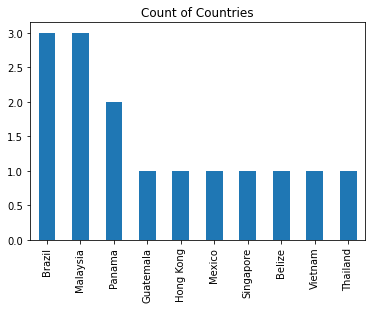

In [ ]:
_=myData['country'].value_counts().plot.bar(title ='Count of Countries')

In [ ]:
print(f'There are {myData["country"].nunique()} different countries.')

There are 10 different countries.


In [ ]:
print(f'There are {myData["city"].nunique()} different cities.')

There are 574 different cities.


We count the 10 most common cities 

In [ ]:
myData['city'].value_counts().sort_values().tail(10)

Barcelona     2
Zanzibar      2
Edinburgh     2
Bedford       2
Birmingham    2
Fairfield     2
Rochester     2
Madrid        3
Miami         4
Monroe        4
Name: city, dtype: int64

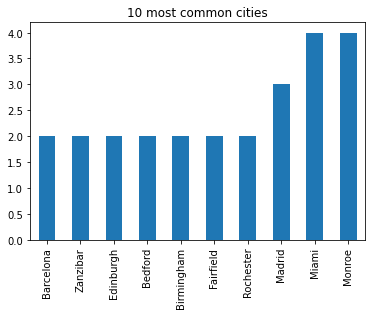

In [ ]:
_ = (myData['city'].value_counts().sort_values().tail(10).plot.bar(title="10 most common cities"))

We check that no cites that dominates the headlines.

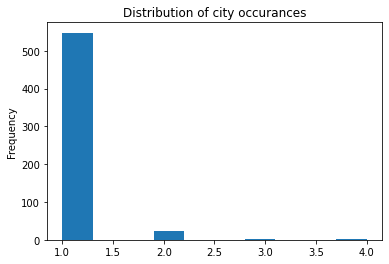

In [ ]:
_ =myData['city'].value_counts().plot.hist(title='Distribution of city occurances')

## Adding Latitude and Longitude for Each City

We can now add the latitude and use accented city names. We'll create an accented name column using our mapping from the previsous section

In [ ]:
import geonamescache
import unidecode
import json

In [ ]:
gc=geonamescache.GeonamesCache()
# we read the saved unaccented_mapping dataset
with open("/content/city_accent_mapping.json",'r') as fin:
  city_accented_mapping=json.loads(fin.read())

#create a column for accented cities
myData['accented_city']=myData['city'].map(city_accented_mapping)
myData[myData['city']!=myData['accented_city']].head(21)

,headline,country,city,accented_city
7,Geneve Scientists Battle to Find Cure,NaN,Geneve,Genève
9,Zika Infested Monkeys in Sao Paulo,NaN,Sao Paulo,São Paulo
17,Louisiana Zika cases up to 26,NaN,NaN,NaN
19,Zika infects pregnant woman in Cebu,NaN,NaN,NaN
47,18 new Zika Cases in Bogota,NaN,Bogota,Bogotá
48,Spanish Flu Sighted in Antigua,NaN,NaN,NaN
63,Carnival under threat in Rio De Janeiro due to...,NaN,NaN,NaN
64,Second Zika Paitient in Brasilia,NaN,Brasilia,Brasília
73,Zika case reported in Oton,NaN,NaN,NaN
76,Hillsborough uses innovative trap against Zika...,NaN,NaN,NaN


In [ ]:
# As can be seen there are several cases where accented city does not match the orignal city

In [ ]:
print(gc.get_cities_by_name('São Paulo'))

[{'3448439': {'geonameid': 3448439, 'name': 'São Paulo', 'latitude': -23.5475, 'longitude': -46.63611, 'countrycode': 'BR', 'population': 10021295, 'timezone': 'America/Sao_Paulo', 'admin1code': '27'}}]


In [ ]:
#This explains the importance of using the accented names.

## Handling Duplicates Cities

The approach is as follows: for each city with multiple entries in geonames, we shall choose the city with the greatest population. We can implement this by checking which of the largest entry for each city. since some cities have multiple locations.

In [ ]:
city='Boston'
gc.get_cities_by_name(city)

[{'2655138': {'admin1code': 'ENG',
   'countrycode': 'GB',
   'geonameid': 2655138,
   'latitude': 52.97633,
   'longitude': -0.02664,
   'name': 'Boston',
   'population': 41340,
   'timezone': 'Europe/London'}},
 {'4930956': {'admin1code': 'MA',
   'countrycode': 'US',
   'geonameid': 4930956,
   'latitude': 42.35843,
   'longitude': -71.05977,
   'name': 'Boston',
   'population': 667137,
   'timezone': 'America/New_York'}}]

In [ ]:
#The Boston US has a large population so we pick it

In [ ]:
matches=gc.get_cities_by_name(city)


In [ ]:
matches

[{'2655138': {'admin1code': 'ENG',
   'countrycode': 'GB',
   'geonameid': 2655138,
   'latitude': 52.97633,
   'longitude': -0.02664,
   'name': 'Boston',
   'population': 41340,
   'timezone': 'Europe/London'}},
 {'4930956': {'admin1code': 'MA',
   'countrycode': 'US',
   'geonameid': 4930956,
   'latitude': 42.35843,
   'longitude': -71.05977,
   'name': 'Boston',
   'population': 667137,
   'timezone': 'America/New_York'}}]

In [ ]:
matches=[{k:v for k,v in list(match.values())[0].items()} for match in matches]

In [ ]:
matches

[{'admin1code': 'ENG',
  'countrycode': 'GB',
  'geonameid': 2655138,
  'latitude': 52.97633,
  'longitude': -0.02664,
  'name': 'Boston',
  'population': 41340,
  'timezone': 'Europe/London'},
 {'admin1code': 'MA',
  'countrycode': 'US',
  'geonameid': 4930956,
  'latitude': 42.35843,
  'longitude': -71.05977,
  'name': 'Boston',
  'population': 667137,
  'timezone': 'America/New_York'}]

In [ ]:
matches=sorted(matches,key=lambda x:x['population'],reverse=True)

In [ ]:
matches

[{'admin1code': 'MA',
  'countrycode': 'US',
  'geonameid': 4930956,
  'latitude': 42.35843,
  'longitude': -71.05977,
  'name': 'Boston',
  'population': 667137,
  'timezone': 'America/New_York'},
 {'admin1code': 'ENG',
  'countrycode': 'GB',
  'geonameid': 2655138,
  'latitude': 52.97633,
  'longitude': -0.02664,
  'name': 'Boston',
  'population': 41340,
  'timezone': 'Europe/London'}]

In [ ]:
# This sorts the cities based on the population

## Finding Locations for Cities

In [ ]:
city_locations=[]
#Go through all the accented cities
for city in myData['accented_city']:
  #find matches (if any)
  matches=gc.get_cities_by_name(city)
  if matches:
    #sort from largest to the smallest population
    matches=[
             {k:v for k,v in list(match.values())[0].items()} for match in matches
        ]
    matches=sorted(matches,key=lambda x: x['population'], reverse=True)
    #find the match with the largest population
    match =matches[0]
    #record the information
    city_locations.append(
        {
         'name':match['name'],
         'latitude':match['latitude'],
         'longitude': match['longitude'],
         'countrycode': match['countrycode'],
         'pop': match['population'],

        }
    )

In [ ]:
city_locations[-10:]

[{'countrycode': 'US',
  'latitude': 36.82523,
  'longitude': -119.70292,
  'name': 'Clovis',
  'pop': 104180},
 {'countrycode': 'US',
  'latitude': 32.72541,
  'longitude': -97.32085,
  'name': 'Fort Worth',
  'pop': 833319},
 {'countrycode': 'US',
  'latitude': 26.52535,
  'longitude': -80.06643,
  'name': 'Boynton Beach',
  'pop': 73966},
 {'countrycode': 'EC',
  'latitude': -1.05458,
  'longitude': -80.45445,
  'name': 'Portoviejo',
  'pop': 170326},
 {'countrycode': 'OM',
  'latitude': 23.58413,
  'longitude': 58.40778,
  'name': 'Muscat',
  'pop': 797000},
 {'countrycode': 'IL',
  'latitude': 31.76904,
  'longitude': 35.21633,
  'name': 'Jerusalem',
  'pop': 801000},
 {'countrycode': 'PH',
  'latitude': 14.19528,
  'longitude': 120.87694,
  'name': 'Indang',
  'pop': 41159},
 {'countrycode': 'FJ',
  'latitude': -18.14161,
  'longitude': 178.44149,
  'name': 'Suva',
  'pop': 77366},
 {'countrycode': 'DO',
  'latitude': 18.45539,
  'longitude': -69.9454,
  'name': 'Bella Vista',
  

In [ ]:
# We can convert this list from a dictionary to a datafrome

In [ ]:
city_locations=pd.DataFrame(city_locations)

In [ ]:
city_locations.tail(7)

,name,latitude,longitude,countrycode,pop
598,Portoviejo,-1.05458,-80.45445,EC,170326
599,Muscat,23.58413,58.40778,OM,797000
600,Jerusalem,31.76904,35.21633,IL,801000
601,Indang,14.19528,120.87694,PH,41159
602,Suva,-18.14161,178.44149,FJ,77366
603,Bella Vista,18.45539,-69.94540,DO,175683
604,Wichita Falls,33.91371,-98.49339,US,104710


In [ ]:
city_locations=city_locations.drop_duplicates()

In [ ]:
print(f'We have the locations for {city_locations.shape[0]} unique cities.')

We have the locations for 574 unique cities.


In [ ]:
# Next we merge with the headlines on the accented_city and name

In [ ]:
myData=pd.merge(myData,city_locations, left_on='accented_city', right_on='name', how='left')

In [ ]:
myData.head(7)

,headline,country,city,accented_city,name,latitude,longitude,countrycode,pop
0,Zika Outbreak Hits Miami,NaN,Miami,Miami,Miami,25.77427,-80.19366,US,441003.0
1,Could Zika Reach New York City?,NaN,New York City,New York City,New York City,40.71427,-74.00597,US,8175133.0
2,First Case of Zika in Miami Beach,NaN,Miami Beach,Miami Beach,Miami Beach,25.79065,-80.13005,US,92312.0
3,"Mystery Virus Spreads in Recife, Brazil",Brazil,Recife,Recife,Recife,-8.05389,-34.88111,BR,1478098.0
4,Dallas man comes down with case of Zika,NaN,Dallas,Dallas,Dallas,32.78306,-96.80667,US,1300092.0
5,Trinidad confirms first Zika case,NaN,Trinidad,Trinidad,Trinidad,-14.83333,-64.90000,BO,84259.0
6,Zika Concerns are Spreading in Houston,NaN,Houston,Houston,Houston,29.76328,-95.36327,US,2296224.0


In [ ]:
#we can check the keeping of the city with the largest population

In [ ]:
myData[myData['city']=='Boston']

,headline,country,city,accented_city,name,latitude,longitude,countrycode,pop
27,Flu season hits Boston,NaN,Boston,Boston,Boston,42.35843,-71.05977,US,667137.0


In [ ]:
myData[myData['city']=='Rochester']

,headline,country,city,accented_city,name,latitude,longitude,countrycode,pop
84,Rochester authorities confirmed the spread of ...,NaN,Rochester,Rochester,Rochester,43.15478,-77.61556,US,209802.0
298,Herpes Keeps Spreading in Rochester,NaN,Rochester,Rochester,Rochester,43.15478,-77.61556,US,209802.0


For each headline we now have the latitude and longitude within a city 

## Data Cleaning

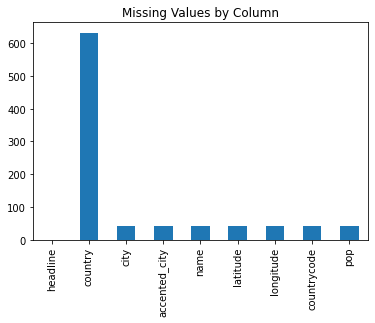

In [ ]:
_=myData.isna().sum().plot.bar(title='Missing Values by Column')

In [ ]:
# We have a lot of missing country details, so we remove it. 

In [ ]:
myData=myData.drop(columns=['country'])

In [ ]:
myData.head(4)

,headline,city,accented_city,name,latitude,longitude,countrycode,pop
0,Zika Outbreak Hits Miami,Miami,Miami,Miami,25.77427,-80.19366,US,441003.0
1,Could Zika Reach New York City?,New York City,New York City,New York City,40.71427,-74.00597,US,8175133.0
2,First Case of Zika in Miami Beach,Miami Beach,Miami Beach,Miami Beach,25.79065,-80.13005,US,92312.0
3,"Mystery Virus Spreads in Recife, Brazil",Recife,Recife,Recife,-8.05389,-34.88111,BR,1478098.0


We investigate headlines that do not have the name

In [ ]:
pd.options.display.max_columns=100
no_name=myData[myData['name'].isna()].copy()
print(f'There are {len(no_name)} headlines without a city.')

There are 42 headlines without a city.


In [ ]:
no_name.tail()

,headline,city,accented_city,name,latitude,longitude,countrycode,pop
596,Zika arrives in Dangriga,NaN,NaN,NaN,NaN,NaN,NaN,NaN
601,More Patients in Maynard are Getting Diagnosed...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
625,Zika case reported in Antioquia,NaN,NaN,NaN,NaN,NaN,NaN,NaN
627,Chikungunya has not Left Pismo Beach,NaN,NaN,NaN,NaN,NaN,NaN,NaN
628,Zika spreads to La Joya,NaN,NaN,NaN,NaN,NaN,NaN,NaN


We can check a few of the above details to make sure that we can't find the the city from headline

In [ ]:
city_set=set(city_accented_mapping.keys())


In [ ]:
for city in ['Dangriga','Maynard','Antioquia','Pismo Beach','La Joya']:
  if city in city_set:
    print('Found', city)
  else:
    print('Did not Find City')

Did not Find City
Did not Find City
Did not Find City
Did not Find City
Did not Find City


The 42 headlines with the city name may have a city, but it is not included in the geonamescache, since the cities are unusable we remove them. 

In [ ]:
myData=myData.dropna(subset=['name'])

In [ ]:
myData.tail()

,headline,city,accented_city,name,latitude,longitude,countrycode,pop
642,Rumors about Rabies spreading in Jerusalem hav...,Jerusalem,Jerusalem,Jerusalem,31.76904,35.21633,IL,801000.0
643,More Zika patients reported in Indang,Indang,Indang,Indang,14.19528,120.87694,PH,41159.0
644,Suva authorities confirmed the spread of Rotav...,Suva,Suva,Suva,-18.14161,178.44149,FJ,77366.0
645,More Zika patients reported in Bella Vista,Bella Vista,Bella Vista,Bella Vista,18.45539,-69.94540,DO,175683.0
646,Zika Outbreak in Wichita Falls,Wichita Falls,Wichita Falls,Wichita Falls,33.91371,-98.49339,US,104710.0


In [ ]:
myData.sample(5)

,headline,city,accented_city,name,latitude,longitude,countrycode,pop
267,More people in Indianapolis are infected with ...,Indianapolis,Indianapolis,Indianapolis,39.76838,-86.15804,US,829718.0
539,West Nile Virus Hits Monroe,Monroe,Monroe,Monroe,32.50931,-92.11930,US,49598.0
389,West Nile Virus Exposure in Racine,Racine,Racine,Racine,42.72613,-87.78285,US,77742.0
280,Zika symptoms spotted in Arlington,Arlington,Arlington,Arlington,32.73569,-97.10807,US,388125.0
275,Phnom Penh hit by Zika Threat,Phnom Penh,Phnom Penh,Phnom Penh,11.56245,104.91601,KH,1573544.0


In [ ]:
myData.describe()

,latitude,longitude,pop
count,605.000000,605.000000,6.050000e+02
mean,26.730761,-38.233048,8.910827e+05
std,20.631955,79.475181,1.973884e+06
min,-53.787690,-156.506040,1.338100e+04
25%,15.711800,-90.444300,5.952300e+04
50%,33.749000,-76.496610,1.713800e+05
75%,40.714270,7.095490,6.480340e+05
max,59.938630,179.364510,1.307630e+07


In [ ]:
print(f'We have  the city locations for {len(myData)} cities')

We have  the city locations for 605 cities


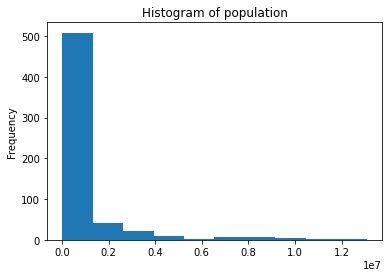

In [ ]:
_=myData['pop'].plot.hist(title='Histogram of population')

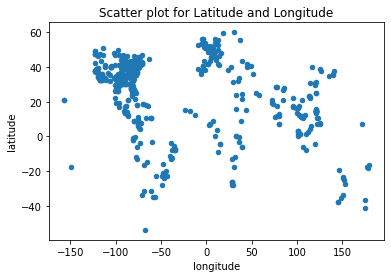

In [ ]:
_=myData.plot.scatter(x='longitude',y='latitude', title='Scatter plot for Latitude and Longitude')

We do a final clean up by removing the name column since it is redundant with the city.  

In [ ]:
myData=myData.drop(columns=['name'])

In [ ]:
myData.tail()

,headline,city,accented_city,latitude,longitude,countrycode,pop
642,Rumors about Rabies spreading in Jerusalem hav...,Jerusalem,Jerusalem,31.76904,35.21633,IL,801000.0
643,More Zika patients reported in Indang,Indang,Indang,14.19528,120.87694,PH,41159.0
644,Suva authorities confirmed the spread of Rotav...,Suva,Suva,-18.14161,178.44149,FJ,77366.0
645,More Zika patients reported in Bella Vista,Bella Vista,Bella Vista,18.45539,-69.94540,DO,175683.0
646,Zika Outbreak in Wichita Falls,Wichita Falls,Wichita Falls,33.91371,-98.49339,US,104710.0


In [ ]:
myData[['headline','city','latitude','longitude','countrycode']].head(10)

,headline,city,latitude,longitude,countrycode
0,Zika Outbreak Hits Miami,Miami,25.77427,-80.19366,US
1,Could Zika Reach New York City?,New York City,40.71427,-74.00597,US
2,First Case of Zika in Miami Beach,Miami Beach,25.79065,-80.13005,US
3,"Mystery Virus Spreads in Recife, Brazil",Recife,-8.05389,-34.88111,BR
4,Dallas man comes down with case of Zika,Dallas,32.78306,-96.80667,US
5,Trinidad confirms first Zika case,Trinidad,-14.83333,-64.90000,BO
6,Zika Concerns are Spreading in Houston,Houston,29.76328,-95.36327,US
7,Geneve Scientists Battle to Find Cure,Geneve,46.20222,6.14569,CH
8,The CDC in Atlanta is Growing Worried,Atlanta,33.74900,-84.38798,US
9,Zika Infested Monkeys in Sao Paulo,Sao Paulo,-23.54750,-46.63611,BR


The DataFrame is the final output for this step, We can now cluster headlines based on the geographical locations. 

In [ ]:
myData.to_csv('/content/processed_headlines_locations.csv')

## Summary

We have:
a) Read the parsed headlines into a dataframe, b) found the location of the city mentioned in the headlines, c) kept the largest city if a city in geonames has multiple times entries d) joined the cities and the headlines e) clearned up the final dataframe to only headlines with a location. Next we move to clustering an visualization of the headlines.

In [ ]:
import pandas as pd


# Clustering Headlines Based on Location

We use both KMeans clustering and DBSCAN algorithms for clustering. We then visualize the clusters on a word map. 



1.   Apply kmeans clustering and DBSCAN algorithms
2.   Visualize the clusters on the world map using the Basemap library
3.   A different algorithm will be used... 
4.    Try using DBSCAN with the greate circle distance two..
5.    Reapeat until a point is assigned a cluster closer to it. 




In [ ]:
# to read the data
myData=pd.read_csv('/content/processed_headlines_locations.csv', index_col=0)
myData[['headline','city','latitude','longitude','countrycode']].head()

,headline,city,latitude,longitude,countrycode
0,Zika Outbreak Hits Miami,Miami,25.77427,-80.19366,US
1,Could Zika Reach New York City?,New York City,40.71427,-74.00597,US
2,First Case of Zika in Miami Beach,Miami Beach,25.79065,-80.13005,US
3,"Mystery Virus Spreads in Recife, Brazil",Recife,-8.05389,-34.88111,BR
4,Dallas man comes down with case of Zika,Dallas,32.78306,-96.80667,US


In [ ]:
myData.head()

,headline,city,accented_city,latitude,longitude,countrycode,pop
0,Zika Outbreak Hits Miami,Miami,Miami,25.77427,-80.19366,US,441003.0
1,Could Zika Reach New York City?,New York City,New York City,40.71427,-74.00597,US,8175133.0
2,First Case of Zika in Miami Beach,Miami Beach,Miami Beach,25.79065,-80.13005,US,92312.0
3,"Mystery Virus Spreads in Recife, Brazil",Recife,Recife,-8.05389,-34.88111,BR,1478098.0
4,Dallas man comes down with case of Zika,Dallas,Dallas,32.78306,-96.80667,US,1300092.0


In [ ]:
print('Missing Values: ')
myData.isna().sum()

Missing Values: 


headline         0
city             0
accented_city    0
latitude         0
longitude        0
countrycode      0
pop              0
dtype: int64

In [ ]:
myData.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 605 entries, 0 to 646
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   headline       605 non-null    object 
 1   city           605 non-null    object 
 2   accented_city  605 non-null    object 
 3   latitude       605 non-null    float64
 4   longitude      605 non-null    float64
 5   countrycode    605 non-null    object 
 6   pop            605 non-null    float64
dtypes: float64(3), object(4)
memory usage: 37.8+ KB


## Clustering Using DBSCAN

First we use DBSCAN algorithm, is a density based algorithm for clustering a set points that works by grouping together cluster points with many close neighbors. 


In [ ]:
from sklearn.cluster import DBSCAN
clusterer=DBSCAN()
clusterer

DBSCAN(algorithm='auto', eps=0.5, leaf_size=30, metric='euclidean',
       metric_params=None, min_samples=5, n_jobs=None, p=None)

### Distance Metric: Euclidean

In [ ]:
def cluster_location(clusterer,myData, lat_string='latitude',lon_string='longitude'):
  """
  Fit a clustering algorithm on location data. 
  """
  features=myData[[lat_string, lon_string]].copy()
  clusterer.fit(features)
  myData['cluster']=clusterer.labels_
  return myData


In [ ]:
myData=cluster_location(clusterer, myData)

In [ ]:
myData['cluster'].value_counts()

-1    476
 4     26
 1     21
 0     19
 6     14
 7     12
 3     12
 5      8
 9      6
 2      6
 8      5
Name: cluster, dtype: int64

In [ ]:
# parameter documentation for DBSCAN - eps

In [ ]:
clusterer.eps=9
myData=cluster_location(clusterer, myData)
myData['cluster'].value_counts()

 0     371
 2      59
 3      57
-1      32
 1      21
 5      16
 8       9
 4       9
 6       8
 11      7
 9       6
 7       6
 10      4
Name: cluster, dtype: int64

In [ ]:
# Number of minimum samples
clusterer.min_samples=3
myData=cluster_location(clusterer, myData)
myData['cluster'].value_counts()

 0     373
 4      62
 2      59
 1      21
-1      16
 8      16
 11      9
 10      9
 5       9
 9       8
 12      6
 7       6
 3       5
 13      3
 6       3
Name: cluster, dtype: int64

In [ ]:
best_euclidean_clusterer=DBSCAN(eps=9,min_samples=3, metric='euclidean',)
myData=cluster_location(best_euclidean_clusterer, myData)

## Visualizing the Clusters

In [ ]:
!apt-get install libgeos-3.5.0
!apt-get install libgeos-dev
!pip install https://github.com/matplotlib/basemap/archive/master.zip

Reading package lists... Done
Building dependency tree       
Reading state information... Done
E: Unable to locate package libgeos-3.5.0
E: Couldn't find any package by glob 'libgeos-3.5.0'
E: Couldn't find any package by regex 'libgeos-3.5.0'
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-440
Use 'apt autoremove' to remove it.
Suggested packages:
  libgdal-doc
The following NEW packages will be installed:
  libgeos-dev
0 upgraded, 1 newly installed, 0 to remove and 33 not upgraded.
Need to get 73.1 kB of archives.
After this operation, 486 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libgeos-dev amd64 3.6.2-1build2 [73.1 kB]
Fetched 73.1 kB in 1s (59.2 kB/s)
Selecting previously unselected package libgeos-dev.
(Reading database ... 144379 files and directories currently installed.)
Pr

In [ ]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
plt.rcParams['font.size']=18

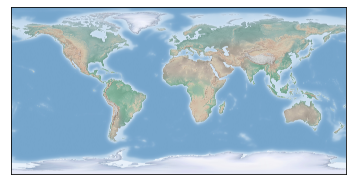

In [ ]:
m=Basemap()
_=m.shadedrelief()

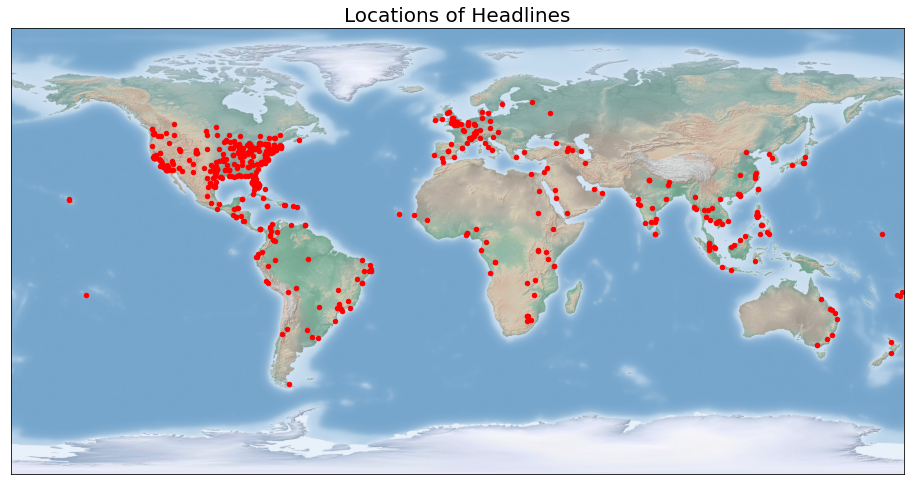

In [ ]:
#make an empty figure
plt.figure(figsize=(16,10))
# convert the longitude, latitude to map projectiion coodinates
x,y=m(x=myData['longitude'], y=myData['latitude'])
m.shadedrelief()
#plot the headline locations
plt.scatter(x,y, 20,marker='o', color='red')
#grab the current axis to se the title (gca)
ax=plt.gca()
_=ax.set_title('Locations of Headlines',size=20)

## Plotting the Clusters

We need to associte colors with each cluster.We iterate through each cluster at a time with a different color. 

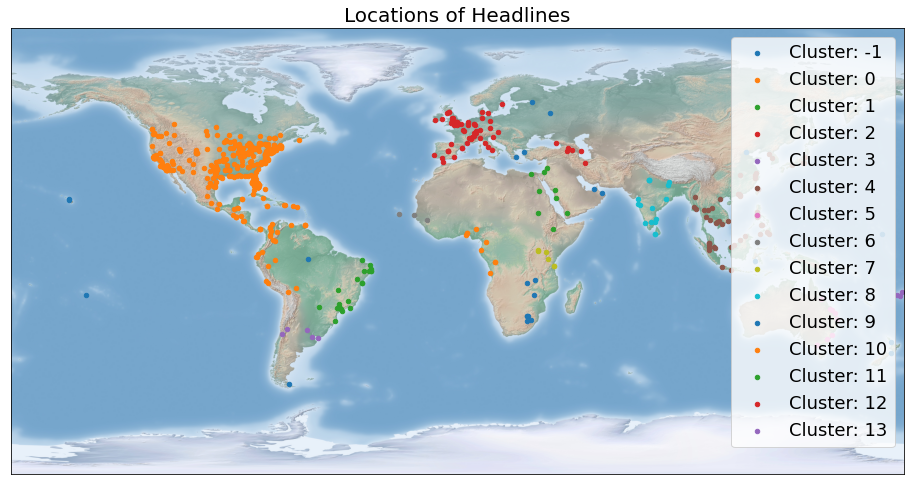

In [ ]:
plt.figure(figsize=(16,10))
m.shadedrelief()
myData['x'], myData['y']=x,y
#iterate through each cluster and plot
for cluster, grouped in myData.groupby('cluster'):
  plt.scatter(grouped['x'], grouped['y'], 20,marker='o', label=f'Cluster: {cluster}')
#grab the figure to set the title and make a legend
ax=plt.gca()
ax.legend()
_=ax.set_title('Locations of Headlines', size=20)

In [ ]:
def plot_clusters(data):
  '''
  plot clustered data on a basemap
  '''
  plt.figure(figsize=(16,10))
  m.shadedrelief()

  #iterate through each cluster and plot
  for cluster, grouped in data.groupby('cluster'):
    if cluster==-1:
      #Handle the unassigned headlines
      plt.scatter(
        grouped['x'],
        grouped['y'],
        s=60,
        alpha=0.8,
        marker='o',
        label=f'Cluster: None',
        c='k',  
      )
    else:
      plt.scatter(
          grouped['x'],
          grouped['y'],
          s=60,
          alpha=0.8,
          marker='o',
          label=f'Cluster: {cluster}',

      )
  ax=plt.gca()
  ax.legend(loc=(1,0))
  _=ax.set_title('Locations of Headlines', size=20)
  


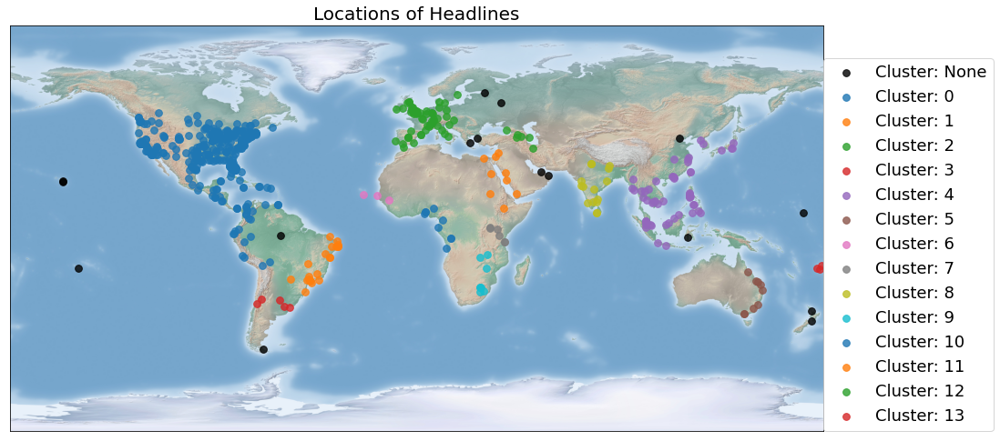

In [ ]:
plot_clusters(myData)
plt.savefig('/content/euclidean_clustering_map.png')

## Great Circle Distance and the Haversine Formula

In [ ]:
import numpy as np

In [ ]:
def great_circle_distance(coord1, coord2,radius=3956):
  '''
  Calculates the great circle distance between two coordinates 
  or arrays of coordinates.
  '''
  if np.array_equal(coord1, coord2):
    return 0.0
  #Convert lat/lon to radians
  coord1, coord2=np.radians(coord1), np.radians(coord2)
  #find the difference between the coordinates
  delta_x, delta_y=coord2-coord1

  #apply Haversin formula
  haversin=np.sin(delta_x/2)**2 +np.product(
      [np.cos(coord1[0]), np.cos(coord2[0]), np.sin(delta_y/2)**2]
  )
  #convert the distance in miles
  return 2*radius*np.arcsin(haversin **0.5)

In [ ]:
# when we pass in coordinates, each column of the array should be a point
# The first column contains latitude and the second the longitude 

In [ ]:
myData.head()

,headline,city,accented_city,latitude,longitude,countrycode,pop,cluster,x,y
0,Zika Outbreak Hits Miami,Miami,Miami,25.77427,-80.19366,US,441003.0,0,-80.19366,25.77427
1,Could Zika Reach New York City?,New York City,New York City,40.71427,-74.00597,US,8175133.0,0,-74.00597,40.71427
2,First Case of Zika in Miami Beach,Miami Beach,Miami Beach,25.79065,-80.13005,US,92312.0,0,-80.13005,25.79065
3,"Mystery Virus Spreads in Recife, Brazil",Recife,Recife,-8.05389,-34.88111,BR,1478098.0,1,-34.88111,-8.05389
4,Dallas man comes down with case of Zika,Dallas,Dallas,32.78306,-96.80667,US,1300092.0,0,-96.80667,32.78306


In [ ]:
coord1=np.array(
    [
    [myData['latitude'].iloc[0], myData['latitude'].iloc[1]],
    [myData['longitude'].iloc[0], myData['longitude'].iloc[1]],
    ]
)



In [ ]:
coord2=np.array(
    [
    [myData['latitude'].iloc[2], myData['latitude'].iloc[0]],
    [myData['longitude'].iloc[2], myData['longitude'].iloc[0]],
    ]
)

In [ ]:
great_circle_distance(coord1,coord2)

array([   1.14462609, 1031.53567987])

In [ ]:
from IPython.display import Image
Image('/content/distance-check.png')

In [ ]:
great_circle_clusterer=DBSCAN(eps=250, min_samples=4,metric=great_circle_distance,)


## Using the Great Circle Distance

In [ ]:
#Cluster using great circl distance
myData=cluster_location(
    great_circle_clusterer,myData,lon_string='longitude',lat_string='latitude'
    )



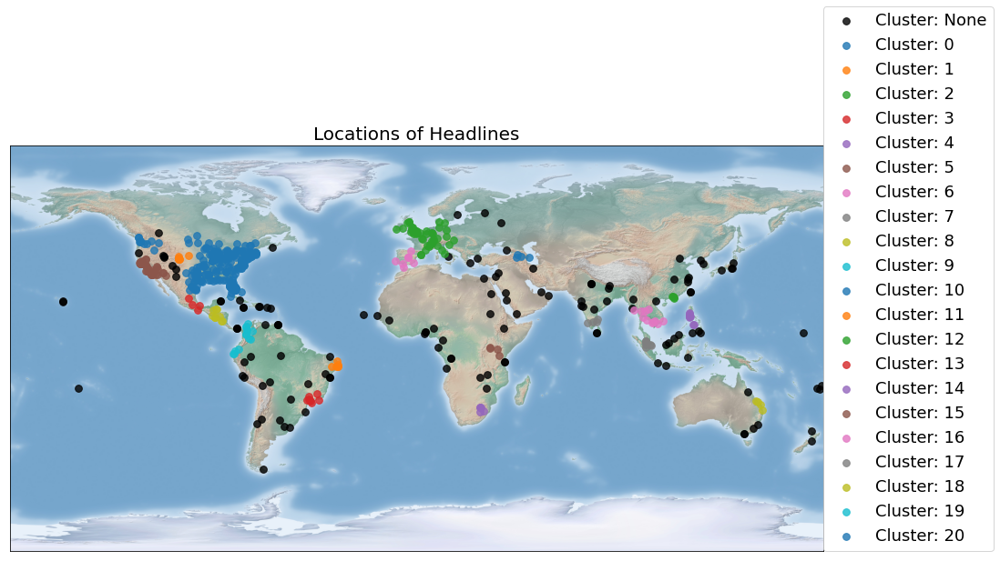

In [ ]:
_=plot_clusters(myData)

In [ ]:
myData['cluster'].value_counts()

 0     237
-1     133
 5      59
 2      49
 4      16
 10     11
 6      11
 8      10
 9       9
 11      8
 16      8
 3       8
 7       7
 1       6
 14      5
 12      4
 20      4
 18      4
 13      4
 15      4
 17      4
 19      4
Name: cluster, dtype: int64

In [ ]:
manhattan_clusterer=DBSCAN(eps=9,min_samples=3,metric='manhattan',)

In [ ]:
myData=cluster_location(manhattan_clusterer, myData)

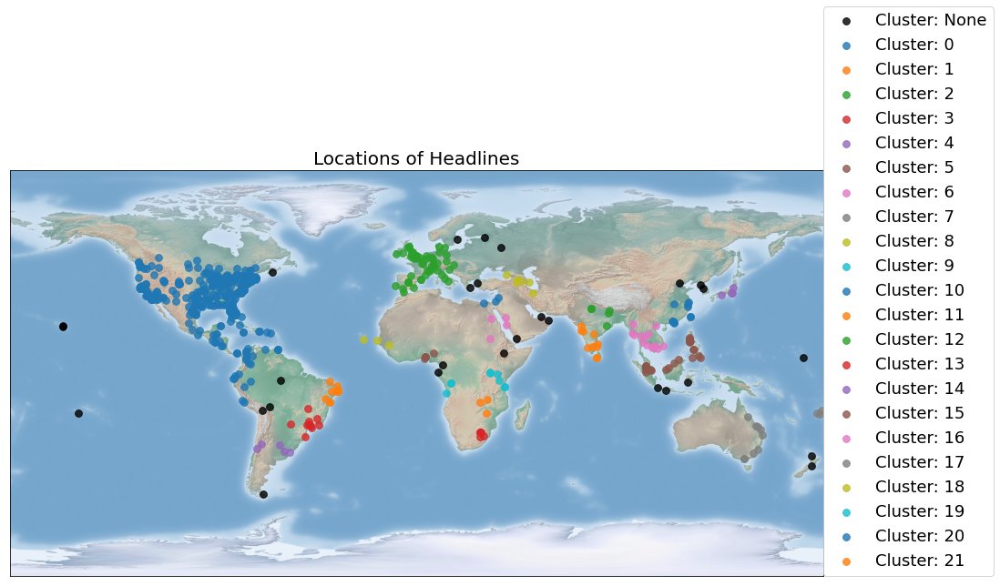

In [ ]:
_=plot_clusters(myData)

## KMeans Clustering 

Kmeans places data into k clusters. Each data point belongs to the cluster with the nearest mean. We use the scikit-learn (sklearn) sklearn.cluster.KMeans

In [ ]:
from sklearn.cluster import KMeans
kmeans_clusterer=KMeans()


In [ ]:
kmeans_clusterer

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=8, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

We try to range the values of the number of clusters n_clusters. For each value we record the inertia, the within-cluster sum of squares criterion

In [ ]:
inertia_values =[]
for k in range(1,11):
  inertia_values.append(KMeans(n_clusters=k).fit(myData[['latitude','longitude']]).inertia_)

In [ ]:
inertia_values

[4072157.1561443666,
 1023778.0415233154,
 481138.3089214747,
 342568.40331152617,
 264648.918106757,
 205377.18083338052,
 150686.9245031709,
 128164.78679032685,
 108821.16369198398,
 94295.35424174127]

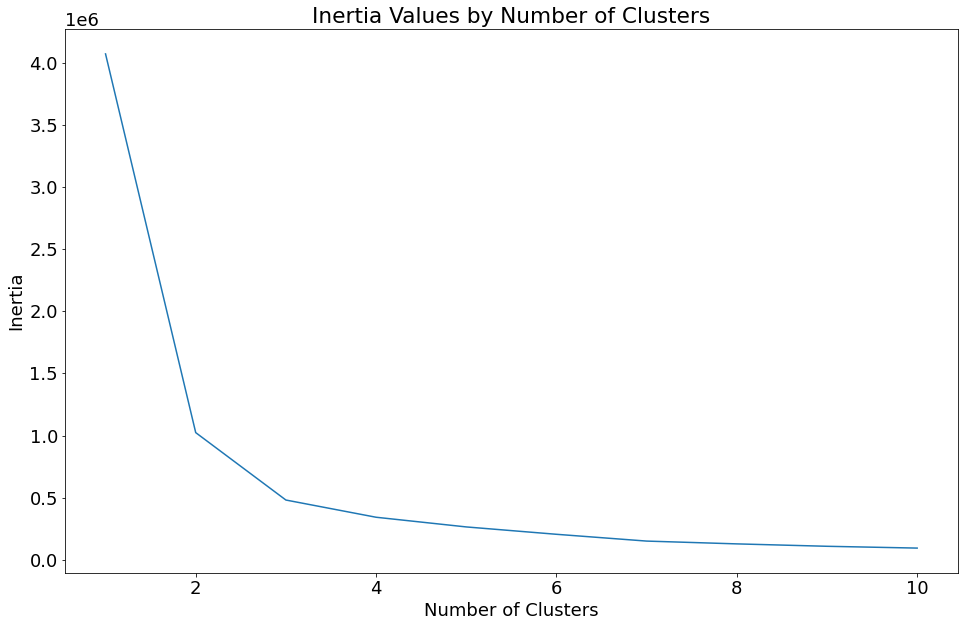

In [ ]:
plt.figure(figsize=(16,10))
plt.plot(range(1,11),inertia_values);
plt.title('Inertia Values by Number of Clusters');
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia');

Elbow is at 3 clusters. At this point we get a low inertia without a large number of clusters

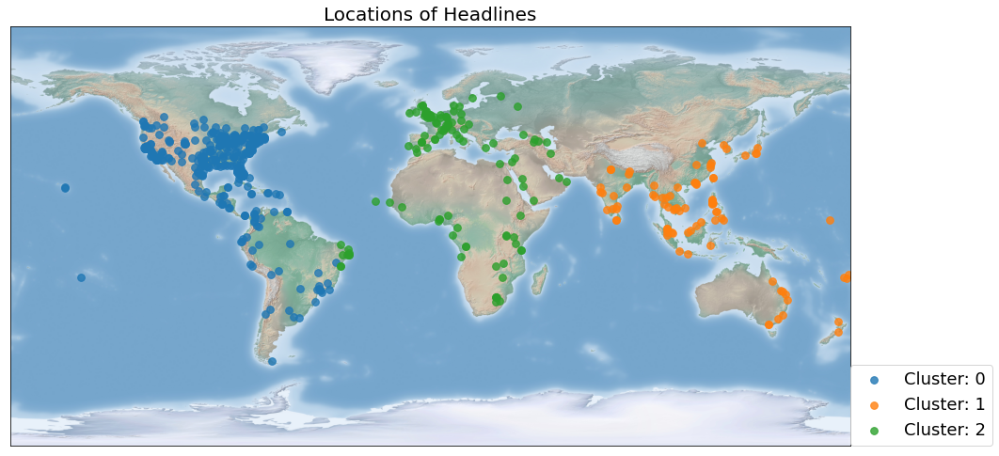

In [ ]:
kmeans_clusterer=KMeans(n_clusters=3)
myData=cluster_location(kmeans_clusterer, myData)
plot_clusters(myData)

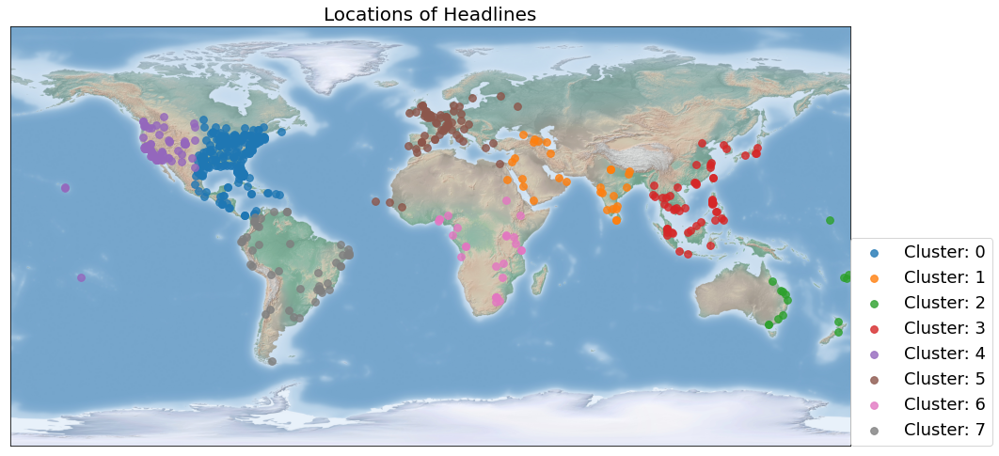

In [ ]:
kmeans_clusterer=KMeans(n_clusters=8)
myData=cluster_location(kmeans_clusterer, myData)
plot_clusters(myData)

Kmeans has the property of assigning every point to a cluster, even when there are outliers in the data. We therefore use the DBSCAN algorithm with our selected parameters and the 'euclidean' metric. 

## World Plot

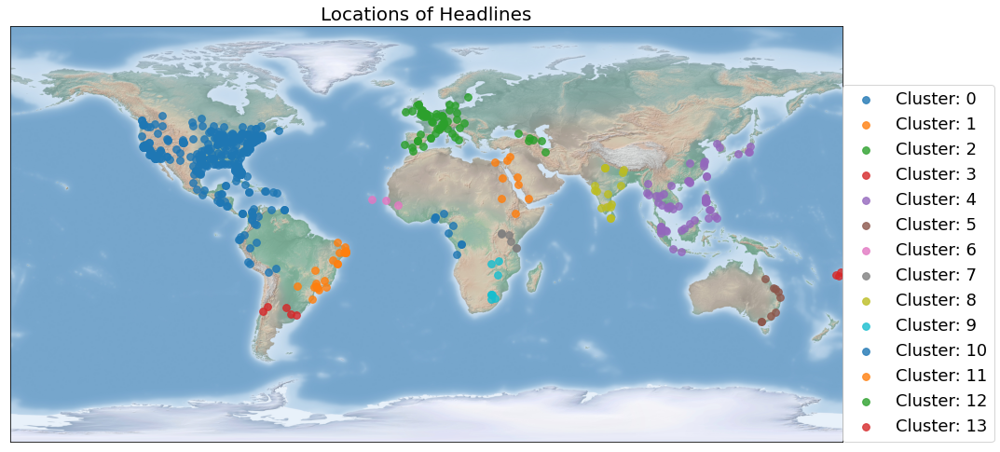

In [ ]:
# We plot without the outliers
best_clusterer=DBSCAN(eps=9,metric='euclidean',min_samples=3)
myData=cluster_location(best_clusterer, myData)
plot_clusters(myData[myData['cluster']!=-1])
plt.savefig('/content/entire_world_clustering.png')

## Sample of data with Headlines

Text(0.5, 1.0, 'Sample of Headlines with Clusters')

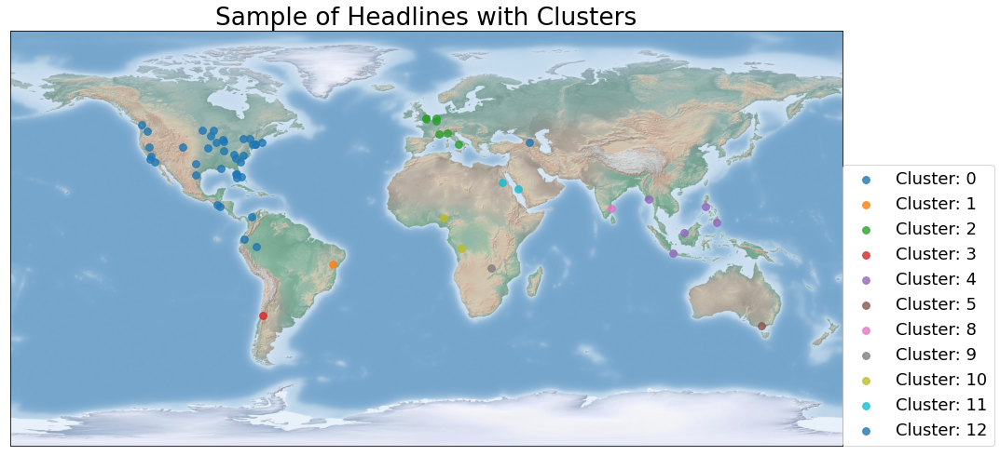

In [ ]:
plot_clusters(myData[myData['cluster']!=-1].sample(frac=0.10))
ax=plt.gca()
plt.rcParams['font.size']=22
ax.set_title('Sample of Headlines with Clusters')

## Cluster Distribution

The clusters are not great, for example the whole of US is in One cluster. That is the distribution of the clusters is skewed, wih one massive cluster and several smaller ones with few headlines

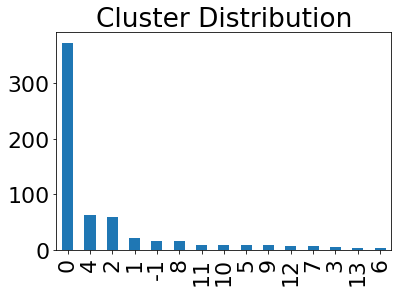

In [ ]:
_=myData['cluster'].value_counts().plot.bar(title='Cluster Distribution')

About half the headlines are coming from the US, we could cluster the data separately. 

In [ ]:
myData.groupby('countrycode')['cluster'].value_counts()['US']

cluster
 0    302
-1      2
Name: cluster, dtype: int64

This skewness of the data means we cluster US and the world separately. 

In [ ]:
myData.to_csv('/content/processed_headlines_clustered.csv')

The final output for this section 
- the datafram with cluster assignment
- The world map with the headlines plotted and colored by cluster assignment

In [ ]:
myData[['headline','city','latitude','longitude','countrycode','cluster']].head(10)

,headline,city,latitude,longitude,countrycode,cluster
0,Zika Outbreak Hits Miami,Miami,25.77427,-80.19366,US,0
1,Could Zika Reach New York City?,New York City,40.71427,-74.00597,US,0
2,First Case of Zika in Miami Beach,Miami Beach,25.79065,-80.13005,US,0
3,"Mystery Virus Spreads in Recife, Brazil",Recife,-8.05389,-34.88111,BR,1
4,Dallas man comes down with case of Zika,Dallas,32.78306,-96.80667,US,0
5,Trinidad confirms first Zika case,Trinidad,-14.83333,-64.90000,BO,0
6,Zika Concerns are Spreading in Houston,Houston,29.76328,-95.36327,US,0
7,Geneve Scientists Battle to Find Cure,Geneve,46.20222,6.14569,CH,2
8,The CDC in Atlanta is Growing Worried,Atlanta,33.74900,-84.38798,US,0
9,Zika Infested Monkeys in Sao Paulo,Sao Paulo,-23.54750,-46.63611,BR,1


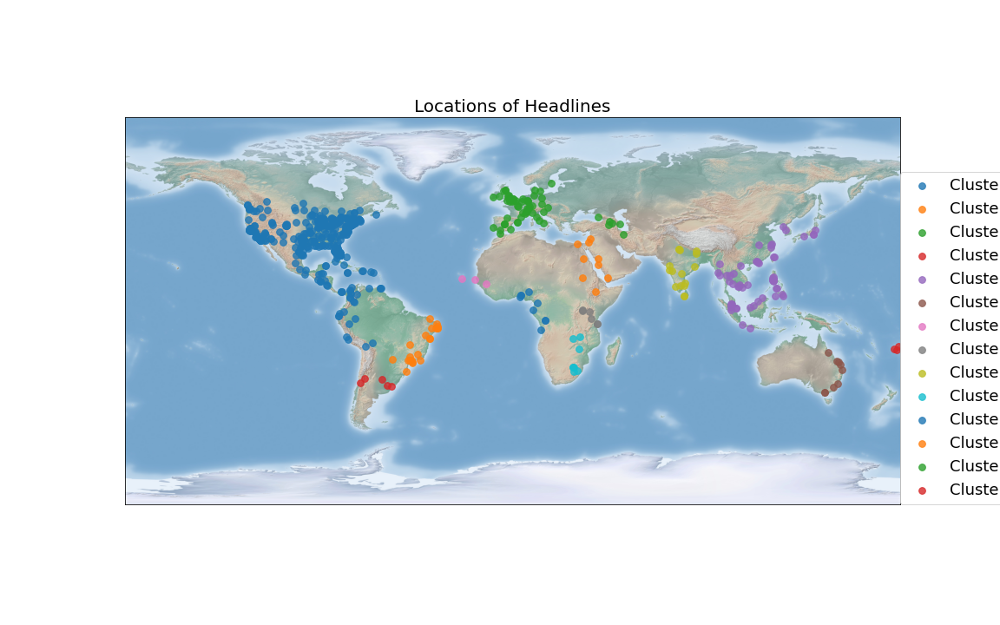

In [ ]:
from IPython.display import Image
Image('/content/entire_world_clustering.png')

In [ ]:
myData[['headline','city','latitude','longitude','countrycode','cluster']].to_csv('/content/clustered_data.csv')

## Conclusion

- We have applied DBSCAN
- Modified the parameters for the DBSCAN
- visualized the clusters
- Evaluated different distance metrics
- KMeans and gave not so good results
- Produced final data with clusters and map of the entire world

# Discovering Pandemics in the US and the worldwide

## Objectives

Worflow
- Separate the data into the world and the US
 - Re- cluster the world and the US data separately
 - Sort the clusters by the number of headlines form the largest to the smallest
 - sort headlines within a cluster by finding the headlines that are closer the centroid
 - Examine the headlines closest to the centre of each cluster. Record any repeated diseases in the headlines. 
 - Pinpoint disease outbreaks based on repeated disease headlines

In [ ]:
# reading the data
import pandas as np

In [ ]:
myData = pd.read_csv('/content/processed_headlines_clustered.csv', index_col=0).drop(columns=['accented_city','pop'])

In [ ]:
myData[['headline','city','latitude','countrycode','cluster']].head(20)

,headline,city,latitude,countrycode,cluster
0,Zika Outbreak Hits Miami,Miami,25.77427,US,0
1,Could Zika Reach New York City?,New York City,40.71427,US,0
2,First Case of Zika in Miami Beach,Miami Beach,25.79065,US,0
3,"Mystery Virus Spreads in Recife, Brazil",Recife,-8.05389,BR,1
4,Dallas man comes down with case of Zika,Dallas,32.78306,US,0
5,Trinidad confirms first Zika case,Trinidad,-14.83333,BO,0
6,Zika Concerns are Spreading in Houston,Houston,29.76328,US,0
7,Geneve Scientists Battle to Find Cure,Geneve,46.20222,CH,2
8,The CDC in Atlanta is Growing Worried,Atlanta,33.74900,US,0
9,Zika Infested Monkeys in Sao Paulo,Sao Paulo,-23.54750,BR,1


In [ ]:
myData.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 605 entries, 0 to 646
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   headline     605 non-null    object 
 1   city         605 non-null    object 
 2   latitude     605 non-null    float64
 3   longitude    605 non-null    float64
 4   countrycode  605 non-null    object 
 5   cluster      605 non-null    int64  
 6   x            605 non-null    float64
 7   y            605 non-null    float64
dtypes: float64(4), int64(1), object(3)
memory usage: 42.5+ KB


## Split the Datasets

In [ ]:
us_data=myData[myData['countrycode']=='US'].copy()
world_data=myData[myData['countrycode']!='US'].copy()
print(f'There are {len(us_data)} headlines in the US.')
print(f'There are {len(world_data)} headlines outside the US.')

There are 304 headlines in the US.
There are 301 headlines outside the US.


In [ ]:
#Reclustering the data
def cluster_location(clusterer, myData, lat_string='latitude',lon_string='longitude'):
  ''' 
  Fit a clustering algorithm on location data.
  '''
  features=myData[[lat_string,lon_string]].copy()
  clusterer.fit(features)
  myData['cluster']=clusterer.labels_
  return myData

In [ ]:
#for US we test with min_samples=10 and eps=3
from sklearn.cluster import DBSCAN
us_clusterer=DBSCAN(eps=3, min_samples=10)
us_data=cluster_location(us_clusterer,us_data)
us_data['cluster'].value_counts()

 1    74
 3    57
-1    51
 4    45
 0    41
 2    21
 5    10
 6     5
Name: cluster, dtype: int64

For the rest the data is more distributed, so we allow greater distance between headlines eps =10 and we decrease the number of headlines needed to 8

In [ ]:
world_clusterer=DBSCAN(eps=10,min_samples=8)
world_data=cluster_location(world_clusterer, world_data)
world_data['cluster'].value_counts()

-1    76
 1    60
 2    59
 3    53
 0    22
 5    11
 4    11
 6     9
Name: cluster, dtype: int64

## Visualizations

In [ ]:
from mpl_toolkits.basemap import Basemap

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams['font.size']=20
us_m=Basemap(
    llcrnrlon=-119,
    llcrnrlat=22,
    urcrnrlon=-64,
    urcrnrlat=49,
    projection='lcc',
    lat_1=33,
    lat_2=45,
    lon_0=-95,
)
# Convert to map coordinates
us_data['x'],us_data['y']=us_m(
    x=list(us_data['longitude']),y=list(us_data['latitude'])

)

#entire word
world_m=Basemap()
world_data['x'],world_data['y']=world_m(
    x=list(world_data['longitude']),y=list(world_data['latitude'])
)

In [ ]:
cluster_color_mapping={
    -1:'k',
    0:'blue',
    1:'green',
    2:'brown',
    3:'purple',
    4:'red',
    5:'orange',
    6:'cyan',
    7:'gray'
}


In [ ]:
# The following plot will generate the plot of the US and the state boundaries. 
def plot_clusters(
    myData, plot_us=False,label_outbreak=None,cluster_centers=None, return_ax=False):
    '''
    Plot headline data and clusters either for the us or the world. optionally
    plot the outbreaks and/or the cluster centres
    '''
    plt.figure(figsize=(20,14))
    plt.rcParams['font.size']=24
    if plot_us:
      #Read the states and draw the map
      us_m.readshapefile('/content/st99_d00','states')
      us_m.shadedrelief()
    else:
      world_m.shadedrelief()
      #iterate through each cluster and plot
    for cluster, grouped in myData.groupby('cluster'):
        cluster_color = cluster_color_mapping[cluster]
        #Used later for plottting outbreaks
        if label_outbreak:
          label=f'Cluster: {cluster} Outbreak: {label_outbreak[cluster]}'
        else:
          label =f'Cluster: {cluster}'
        #plot the data point as a scatter plot colored b the cluster membership
        plt.scatter(
            grouped['x'],
            grouped['y'],
            s=80,
            alpha=1,
            marker='o',
            label=label,
            c=cluster_color,
        )
    if cluster_centers:
          #Iterate through the clusters centres
          for cluster in cluster_centers:
            color=cluster_color_mapping[cluster['cluster']]
            plt.scatter(cluster['x'],cluster['y'], s=300, alpha=1, marker='*', c=color)

          # add legend and title
    ax= plt.gca()
    ax.legend(loc=(1,0))
    if plot_us:
            _=ax.set_title('Locations of US Headlines')
    else:
              _=ax.set_title('Locations of World Headlines')
    if return_ax:
          return ax 



## Analyze World Clusters

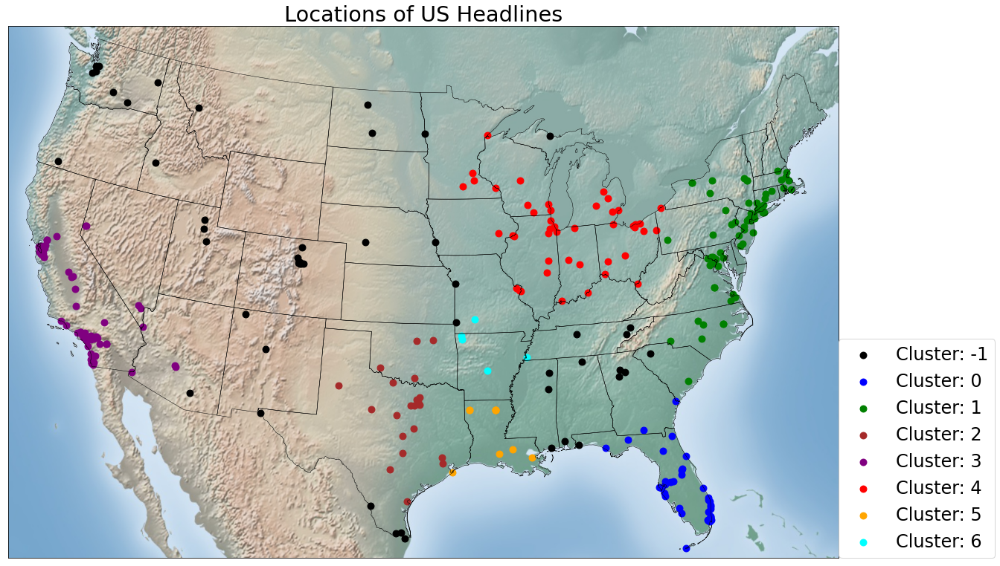

In [ ]:
plot_clusters(us_data,True)

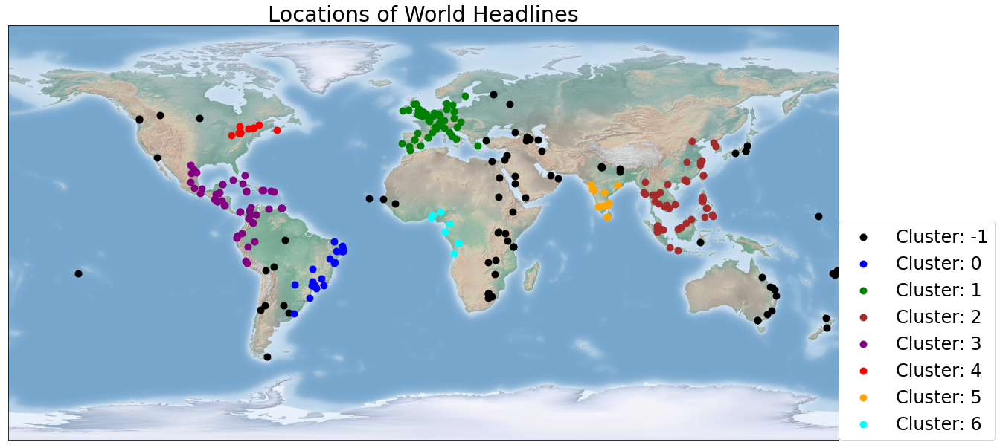

In [ ]:
plot_clusters(world_data, False)

# Analyzes of World Clusters

Will need to check the **center** for each cluster (centroid).We are using the latitude and longitude for this problem.

In [ ]:
import math


In [ ]:
def find_centroid(myData):
    """
    Calculate the centroid of geographic points.
    based on https://stackoverflow.com/a/57346455/5755357
    """
    x=0
    y=0
    z=0
    # Iterate through each cordinate in radians
    for longitude, latitude in zip(myData['longitude'],myData['latitude']):
      longitude, latitude =math.radians(longitude),math.radians(latitude)
      #convert to a 3D position in radians
      x+=math.cos(latitude) * math.cos(longitude)
      y+=math.cos(latitude)* math.sin(longitude)
      z+=math.sin(latitude)
   # We get the averages of each radians
    n=len(myData)
    x/=n  # x=x/n
    y/=n
    z/=n
    #apply the formula
    central_longitude=math.atan2(y,x)
    central_square_root=math.sqrt(x**2 +y**2)
    central_latitude = math.atan2(z,central_square_root)
    #convert back to degrees
    centroid=dict(
       latitude=math.degrees(central_latitude),
       longitude=math.degrees(central_longitude),
      )
    return centroid





We use the function to get details of a specific cluster and passing the cluster's point into algorithm

In [ ]:
find_centroid(world_data[world_data['cluster']==3])

{'latitude': 12.486372077535997, 'longitude': -80.8688710028379}

## Extracting Information about World Clusters

For each cluster outside the US, we'll find the number of points in the cluster and the center of the cluster.

In [ ]:
def analyze_clusters(myData, data_map):
  """
  Find the centers of each cluster and the number of points in a cluster
  """
  clusters=[]
  #Iterate through each cluster
  for cluster, grouped in myData.groupby('cluster'):
    #find the center location of the cluster
    cluster_centroid=find_centroid(grouped)
    #Convert the center to x, y in the map projections system
    x,y=data_map(cluster_centroid['longitude'],cluster_centroid['latitude'])
    #record the cluster number, count of points in the cluster and the location of the cluster center
    clusters.append(
        dict(
            cluster =cluster,
             count=len(grouped),
             longitude=cluster_centroid['longitude'],
             latitude=cluster_centroid['latitude'],
             x=x,
             y=y,

        )
    )
  return clusters



In [ ]:
word_clusters =analyze_clusters(world_data, world_m)

In [ ]:
word_clusters[:4]

[{'cluster': -1,
  'count': 76,
  'latitude': 14.622809793813127,
  'longitude': 55.971290978097166,
  'x': 55.971290978097166,
  'y': 14.622809793813127},
 {'cluster': 0,
  'count': 22,
  'latitude': -16.77402502603969,
  'longitude': -42.856222988193664,
  'x': -42.856222988193664,
  'y': -16.77402502603969},
 {'cluster': 1,
  'count': 60,
  'latitude': 48.67720650036662,
  'longitude': 3.364032817746846,
  'x': 3.364032817746846,
  'y': 48.67720650036662},
 {'cluster': 2,
  'count': 59,
  'latitude': 14.624445116102136,
  'longitude': 112.89691730563824,
  'x': 112.89691730563824,
  'y': 14.624445116102136}]

## Visualizing the Cluster Centers

To check that we have calculated the cluster centroid correctly, using the visualization function we plot the cluster centers if we get them.

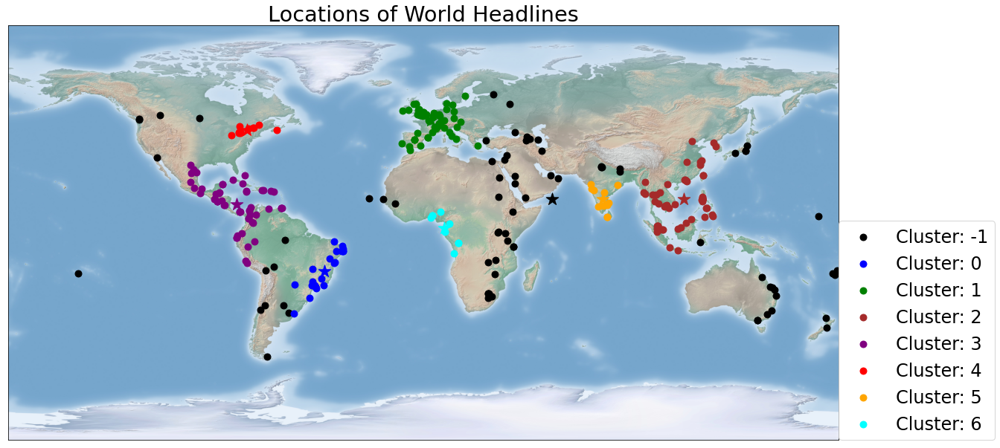

In [ ]:
plot_clusters(world_data, cluster_centers=word_clusters)

The clusters appear to be correct.We have the locations of all the clusters and their centers of the entire world. Next we find the distance of each headline form the cluster centroid to which it is assigned.

In [ ]:
world_data=world_data.merge(
    pd.DataFrame(word_clusters), on=['cluster'],suffixes=["", '_cluster_center']
)


In [ ]:
world_data.head(10).T

,0,1,2,3,4,5,6,7,8,9
headline,"Mystery Virus Spreads in Recife, Brazil",Zika Infested Monkeys in Sao Paulo,Zika spreading to Salvador,"Zika outbreak in Piracicaba, Brazil",Second Zika Paitient in Brasilia,"Student sick in Campinas, Brazil",New Zika Case Confirmed in Belo Horizonte,Montevideo Encounters Severe Symptoms of Rotav...,Zika Troubles come to Niteroi,Zika arrives in Santos
city,Recife,Sao Paulo,Salvador,Piracicaba,Brasilia,Campinas,Belo Horizonte,Montevideo,Niteroi,Santos
latitude,-8.05389,-23.5475,-12.9711,-22.7253,-15.7797,-22.9056,-19.9208,-34.9033,-22.8833,-23.9608
longitude,-34.8811,-46.6361,-38.5108,-47.6492,-47.9297,-47.0608,-43.9378,-56.1882,-43.1036,-46.3336
countrycode,BR,BR,BR,BR,BR,BR,BR,UY,BR,BR
cluster,0,0,0,0,0,0,0,0,0,0
x,-34.8811,-46.6361,-38.5108,-47.6492,-47.9297,-47.0608,-43.9378,-56.1882,-43.1036,-46.3336
y,-8.05389,-23.5475,-12.9711,-22.7253,-15.7797,-22.9056,-19.9208,-34.9033,-22.8833,-23.9608
count,22,22,22,22,22,22,22,22,22,22
longitude_cluster_center,-42.8562,-42.8562,-42.8562,-42.8562,-42.8562,-42.8562,-42.8562,-42.8562,-42.8562,-42.8562


In [ ]:
world_data.sample(6).T

,110,122,123,18,124,35
headline,Mad Cow Disease Re-emerges in Chatham,Mad Cow Disease Hits Rotterdam,More Patients in Dublin are Getting Diagnosed ...,More Zika patients reported in Custodia,More Patients in Stuttgart are Getting Diagnos...,Malaria is Spreading in Johannesburg
city,Chatham,Rotterdam,Dublin,Custodia,Stuttgart,Johannesburg
latitude,51.3789,51.9225,53.3331,-8.0875,48.7823,-26.2023
longitude,0.52786,4.47917,-6.24889,-37.6431,9.17702,28.0436
countrycode,GB,NL,IE,BR,DE,ZA
cluster,1,1,1,0,1,-1
x,0.52786,4.47917,-6.24889,-37.6431,9.17702,28.0436
y,51.3789,51.9225,53.3331,-8.0875,48.7823,-26.2023
count,60,60,60,22,60,76
longitude_cluster_center,3.36403,3.36403,3.36403,-42.8562,3.36403,55.9713


## Distance between the Headline and the Cluster Center

We need to use the Great Circle Distance. Haversine formula to calculate the distance along the spherical Earth.

In [ ]:
import numpy as np


In [ ]:
def haversine_formula_two_arrays(longitude_one, latitude_one, longitude_two, latitude_two):
  """
  Calculate the Great Circle Distance between two points
  using the Haversine Formula. latitude and longitude are in degrees
  """
  #convert to radians
  longitude_one, latitude_one, longitude_two, latitude_two=map(np.radians,[longitude_one, latitude_one, longitude_two,latitude_two])
  #apply the Haversine Formula
  delta_longitude= longitude_two - longitude_one
  delta_latitude=latitude_two - latitude_one
  #formula
  a= (np.sin(delta_latitude/2)**2 + np.cos(latitude_one)* np.cos(latitude_two)* np.sin(delta_longitude /2)**2)
  #convert from radians to km
  d=2*np.arcsin(np.sqrt(a))
  radius_miles=3956
  return d*radius_miles


In [ ]:
#We can now find the distance between every point and its respective cluster center 
#in one call to the function

In [ ]:
world_data['distance']=haversine_formula_two_arrays(
    world_data['longitude'],
    world_data['latitude'],
    world_data['longitude_cluster_center'],
    world_data['latitude_cluster_center'],
)


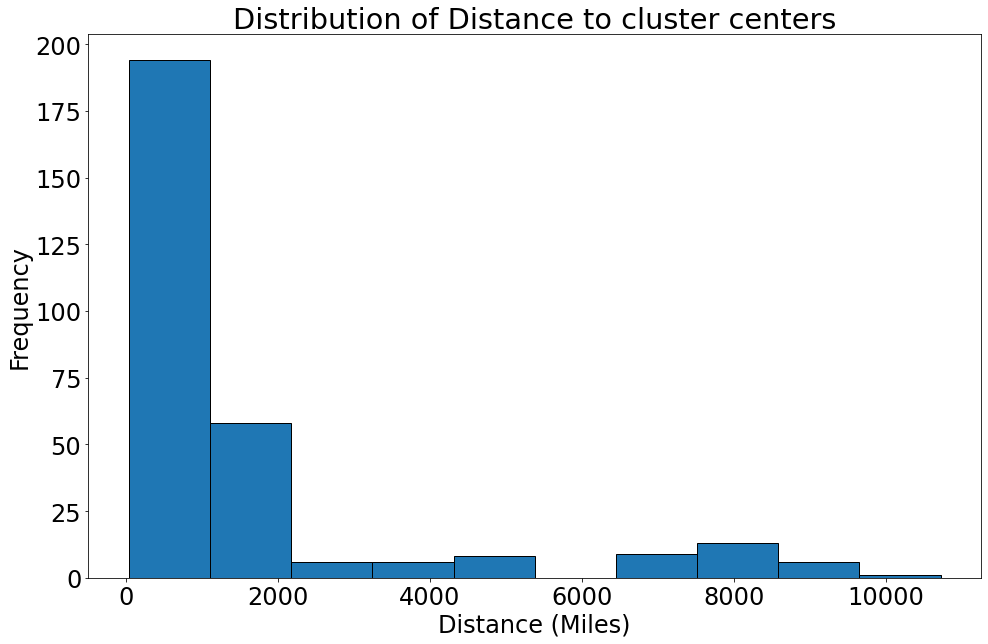

In [ ]:
_=world_data['distance'].plot.hist( title='Distribution of Distance to cluster centers',figsize=(16,10),edgecolor='k')
plt.xlabel('Distance (Miles)');

## Distribution of the Distance to cluster centers

In [ ]:
#Using seaborn and the kernel density estimation graph. 

In [ ]:
import seaborn as sns

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


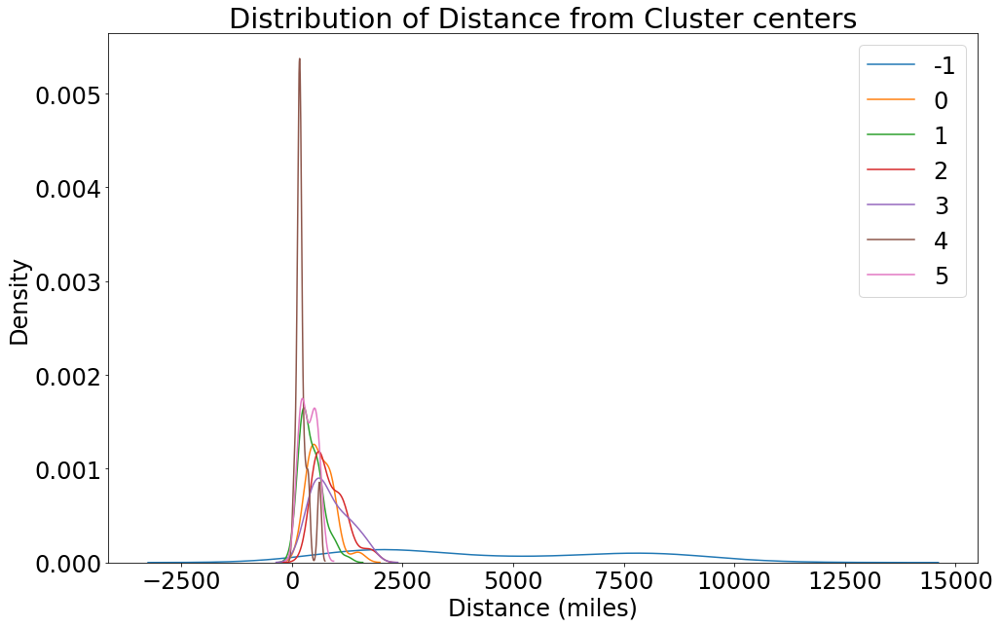

In [ ]:
plt.figure(figsize=(16,10))
for cluster, grouped in world_data.groupby('cluster'):
  if len(grouped)<10:
    continue
  else:
    sns.kdeplot(grouped['distance'],label=f"{cluster}")
ax=plt.gca()
_=ax.set_title('Distribution of Distance from Cluster centers')
_= ax.set_xlabel('Distance (miles)')
_=ax.set_ylabel('Density')


In [ ]:
# We can sort the clusters by size and distance to center
world_data = world_data.sort_values(by=['count','distance'],ascending=[False,True])

In [ ]:
world_data.head(20).T

,95,47,91,46,84,50,49,70,92,39,30,83,40,96,69,78,72,76,77,31
headline,Influenza Exposure in Muscat,Authorities are Worried about the Spread of No...,Chlamydia Exposure in Sanaa,Mecca tests new cure for Chikungunya,Will Rotavirus vaccine help Addis Ababa?,Meningitis re-emerges in Medina,Bronchitis re-emerges in Tehran,Rumors about Rabies Spreading in Khartoum have...,Hepatitis D Exposure in Aswan,New Delhi Addressing Zika Concerns,Zika: Delhi for strict monitoring,Zika Troubles come to Greater Noida,Molo Cholera Spread Causing Concern,Rumors about Rabies spreading in Jerusalem hav...,Hepatitis C re-emerges in Damascus,Tourist Perishes from Malaria in Arusha,The Spread of Herpes in Baku has been Confirmed,The Spread of Malaria in Zanzibar has been Con...,Malaria Outbreak Hits Zanzibar's Tourist Industry,Ebola outbreak in Kampala
city,Muscat,Dubai,Sanaa,Mecca,Addis Ababa,Medina,Tehran,Khartoum,Aswan,New Delhi,Delhi,Greater Noida,Molo,Jerusalem,Damascus,Arusha,Baku,Zanzibar,Zanzibar,Kampala
latitude,23.5841,25.0772,15.3547,21.4266,9.02497,24.4686,35.6944,15.5518,24.0908,28.6358,28.6519,28.4962,-0.24849,31.769,33.5102,-3.36667,40.3777,-6.16394,-6.16394,0.31628
longitude,58.4078,55.3093,44.2067,39.8256,38.7469,39.6142,51.4215,32.5324,32.8994,77.2245,77.2315,77.536,35.7319,35.2163,36.2913,36.6833,49.892,39.1979,39.1979,32.5822
countrycode,OM,AE,YE,SA,ET,SA,IR,SD,EG,IN,IN,IN,KE,IL,SY,TZ,AZ,TZ,TZ,UG
cluster,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
x,58.4078,55.3093,44.2067,39.8256,38.7469,39.6142,51.4215,32.5324,32.8994,77.2245,77.2315,77.536,35.7319,35.2163,36.2913,36.6833,49.892,39.1979,39.1979,32.5822
y,23.5841,25.0772,15.3547,21.4266,9.02497,24.4686,35.6944,15.5518,24.0908,28.6358,28.6519,28.4962,-0.24849,31.769,33.5102,-3.36667,40.3777,-6.16394,-6.16394,0.31628
count,76,76,76,76,76,76,76,76,76,76,76,76,76,76,76,76,76,76,76,76
longitude_cluster_center,55.9713,55.9713,55.9713,55.9713,55.9713,55.9713,55.9713,55.9713,55.9713,55.9713,55.9713,55.9713,55.9713,55.9713,55.9713,55.9713,55.9713,55.9713,55.9713,55.9713


## Look for Patterns in Headlines

In [ ]:
# we look for the top 5 headlines as measured by closest distance to the cluster center
for cluster, grouped in world_data.groupby('cluster'):
  print('\n Cluster ', cluster)
  print("Number of headlines: ", len(grouped))
  print('Top 5 Headlines')
  print(list(grouped.nsmallest(n=5,columns='distance')['headline']))


 Cluster  -1
Number of headlines:  76
Top 5 Headlines
['Influenza Exposure in Muscat', 'Authorities are Worried about the Spread of Norovirus in Dubai', 'Chlamydia Exposure in Sanaa', 'Mecca tests new cure for Chikungunya', 'Will Rotavirus vaccine help Addis Ababa?']

 Cluster  0
Number of headlines:  22
Top 5 Headlines
['New Zika Case Confirmed in Belo Horizonte', 'Second Zika Paitient in Brasilia', 'Zika spreading to Salvador', 'More Zika patients reported in Camacari', 'Zika case reported in Jacobina']

 Cluster  1
Number of headlines:  60
Top 5 Headlines
['More Livestock in Fontainebleau are infected with Mad Cow Disease', 'Scientists in Paris to look for answers', 'Mad Cow Disease Disastrous to Brussels', 'Sick Livestock Leads to Serious Trouble for Belfort', 'Will MCD vaccine help Strasbourg?']

 Cluster  2
Number of headlines:  59
Top 5 Headlines
['Nha Trang Zika Outbreak', "Zika cases in Vietnam's Ho Chi Minh City surge", 'Zika Troubles come to Kampong Cham', 'More Zika patien

In [ ]:
#vizualizing world outbreaks
world_outbreak_mapping = {0:'Zika',1:'Mad Cow',2:'Zika', 5: 'Zika'}

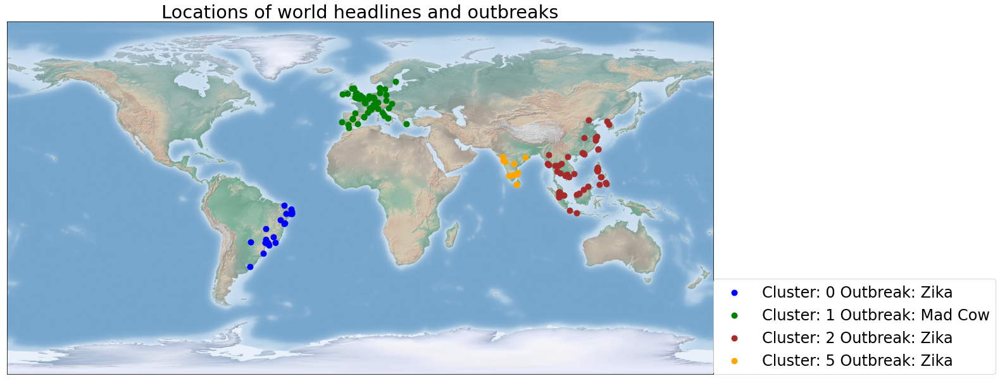

In [ ]:
plot_clusters(
    world_data[world_data['cluster'].isin(world_outbreak_mapping.keys())],
    label_outbreak=world_outbreak_mapping,
)
ax=plt.gca()
_=ax.set_title('Locations of world headlines and outbreaks')